In [1]:
%matplotlib notebook
import stingray.events as ev
import stingray.lightcurve as lc
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.ticker import ScalarFormatter
from stingray import io
from astropy.io import fits, ascii
from astropy.table import Table
import stingray.powerspectrum as powspec 
import stingray.crossspectrum as crossspec
from hendrics.efsearch import dyn_folding_search, z_n_search, folding_search
import stingray.gti as sting_gti
import numpy as np
import pickle
import seaborn as sns
import scipy

sns.set_context('talk')
# sns.set_style("whitegrid")
sns.set_palette("colorblind")

buff = 100
swift_start = 307671262.555
swift_stop = 307671601.041

# def lc_rebin(curve, dt_new):
#     if not dt_new%%curve.dt:
#         print('New bin size must be an integer value of the old bin size')
#         return None
#     new_time = []
#     new_counts = []
#     new_err = []
#     for g in curve.gti:
        
    

def nuproducts_to_stingray_lc(nuprod_lc_file, rebin = False, buffer = False, rebinsize=1.0, buffersize = 100.0, rebin_method='sum'):
    nuproducts_lc = fits.open(nuprod_lc_file)
    time = nuproducts_lc[1].data['TIME'] + nuproducts_lc[1].header['TSTART']
    dt = time[1]-time[0]
    counts = nuproducts_lc[1].data['RATE'] * dt
    error = nuproducts_lc[1].data['ERROR'] * dt
    mjdref = nuproducts_lc[1].header['MJDREFI'] + nuproducts_lc[1].header['MJDREFF']
    gti = [[x,y] for x,y in nuproducts_lc[2].data]
    if buffer:
        buffered_gti = []
        for x,y in gti:
            if np.abs(y-x) > 2*buffersize:
                buffered_gti.append([x+buffersize, y-buffersize])
        gti = buffered_gti
    if rebin:
        return lc.Lightcurve(time, counts, err=error, gti=gti, mjdref=mjdref).rebin(dt_new=rebinsize, method=rebin_method)
    else:
        return lc.Lightcurve(time, counts, err=error, gti=gti, mjdref=mjdref)
    
def extract_events(file_A, file_B, PI_min = 35, PI_max = 1909):
    # Extracts events for FPMA and FPMB from .evt files (assumed clean). An energy range can be specified.
    # The gtis are crossed to make sure they are the same.
    
    ev_files = [fits.open(file_A), fits.open(file_B)] 
    
    ev_data_A = ev_files[0][1].data
    ev_data_B = ev_files[1][1].data
    
    PI_mask_A = (ev_data_A['PI'] >= PI_min) * (ev_data_A['PI'] <= PI_max)
    PI_mask_B = (ev_data_B['PI'] >= PI_min) * (ev_data_B['PI'] <= PI_max)
    
    ev_gti_A = [[x,y] for x,y in ev_files[0][2].data]
    ev_gti_B = [[x,y] for x,y in ev_files[1][2].data]
    common_gti = sting_gti.cross_two_gtis(ev_gti_A, ev_gti_B)
    buffered_gti = []
    for x,y in common_gti:
        if np.abs(y-x) > 2*buff:
            buffered_gti.append([x+buff, y-buff])

    events = [ev.EventList(time=ev_data_A['TIME'][PI_mask_A], gti=buffered_gti, pi = ev_data_A['PI'][PI_mask_A], \
                       mjdref=ev_files[0][0].header['MJDREFI'] + ev_files[0][0].header['MJDREFF']), \
              ev.EventList(time=ev_data_B['TIME'][PI_mask_B], gti=buffered_gti, pi = ev_data_B['PI'][PI_mask_B], \
                       mjdref=ev_files[1][0].header['MJDREFI'] + ev_files[1][0].header['MJDREFF'])]
    ev_files[0].close()
    ev_files[1].close()
    return events


    

def split_ev_by_gti(events):
    split_ev = []
    gti = events.gti
    for g in gti:
        split_ev.append(ev.EventList(time=events.time, gti=[g], pi = events.pi, \
                       mjdref=events.mjdref))
    return split_ev

def split_ev_by_time(events, bintime=100):
    split_ev = []
    gti = events.gti
    for g in gti:
        g_len = g[1]-g[0]
        for i in range(int(np.floor(g_len/bintime))):
            split_ev.append(ev.EventList(time=events.time, gti=[[g[0]+(i*bintime), g[0]+((i+1)*bintime)]], \
                                         pi = events.pi, mjdref=events.mjdref))
    return split_ev
    

def read_QDP(file):
#     Takes in a file and returns an array with the QDP data
    data = [[]]
    i = 0
    j = 0
    for line in file:
        if i >2:
            temp = line.split()
            if temp[0] != 'NO':
                if temp[-1]=='NO':
                    temp = temp[:-1]
                data[-1].append(temp)
            else:
                data.append([])
        i += 1
    for i in range(len(data)):
        data[i] = np.array(data[i]).astype(float).T
    return data

def line(B, x):
    return (B[0]*x) + B[1]
    
def calc_pvals(power,nspec):
    exp_sigma = np.sqrt(2) / np.sqrt(nspec)
    gauss = scipy.stats.norm(0, exp_sigma)
    pval = gauss.sf(power)
    return pval
    
    

# data_dir = '/Volumes/LaCie/AstroData/J1739-285/nustar/timing/matteo_corrections/'
data_dir = '/disk/lif2/spike/J1739m285/timing/'
# plot_dir = '/Users/sean/Desktop/J1739-285/matteo_corrections/'
plot_dir = '/disk/lif2/spike/J1739m285/figures/'
# def flare_search(lc, threshold_sigma=1.5):
    

# Extract events

In [2]:
PI_min = 35     # 3.0 keV
# PI_min = 260     # 12.0 keV
# PI_max = 1210   # 50.0 keV
PI_max = 1909   # 78.0 keV
events = extract_events(data_dir + 'nu90501343002A01_cl_regfilt_barycorr.evt', \
            data_dir + 'nu90501343002B01_cl_regfilt_barycorr.evt', PI_min=PI_min, PI_max=PI_max)
joined_events = events[0].join(events[1])
# print(events[0].time)

<IPython.core.display.Javascript object>


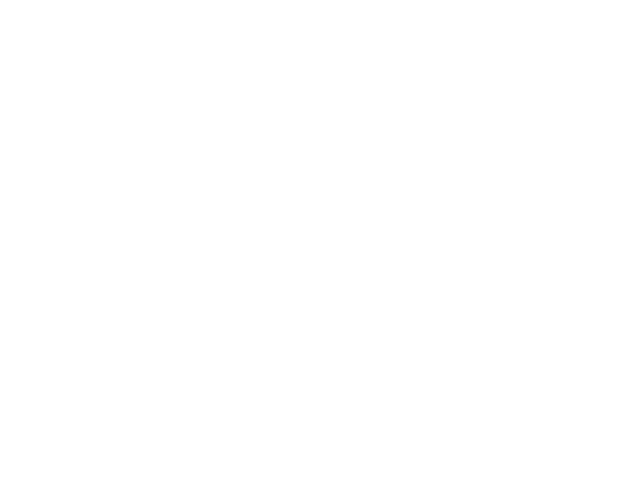

<IPython.core.display.Javascript object>


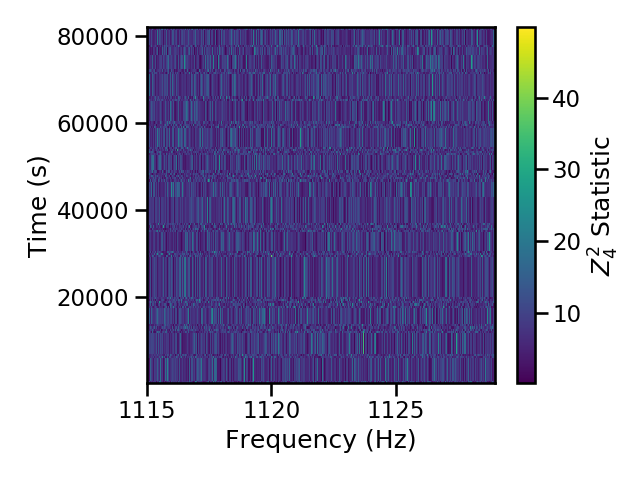

In [13]:
times, frequencies, stats = dyn_folding_search(joined_events, 1115, 1129, time_step=512, oversample=10, func=z_n_search)

plt.figure()
plt.pcolormesh(frequencies, times - joined_events.gti[0, 0], stats)
plt.ylabel('Time (s)')
plt.xlabel('Frequency (Hz)')

clrbar = plt.colorbar()
clrbar.set_label(r'$Z^{2}_{4}$' + ' Statistic')
plt.tight_layout()
#plt.savefig('/Users/sean/Desktop/SMC_X-1/letter/figures/nu10002013003_filt_nustar_E3-79_freq_search.eps')

Searching 329605 frequencies


<IPython.core.display.Javascript object>


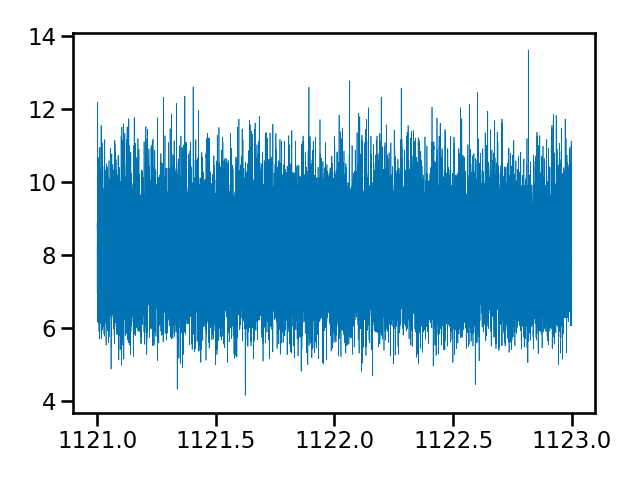

In [3]:
results = folding_search(joined_events, 1121, 1123, func=z_n_search)

ff, stats, step, length = results
plt.figure()
plt.plot(ff, stats, lw=0.5)
plt.tight_layout()

# fpopt, fpcov = curve_fit(gauss, ff[70:80], stats[70:80], p0 = [3000,1.4262, 0.00015])
# print(fpopt)
# print(np.diag(fpcov))

# plt.plot(ff, np.vectorize(gauss)(ff, *fpopt), color = 'r')

# FFT Search

In [3]:
nuprod_curve = nuproducts_to_stingray_lc(data_dir + 'nu90501343002A01_sr.lc', buffer=True, buffersize=buff)


<IPython.core.display.Javascript object>


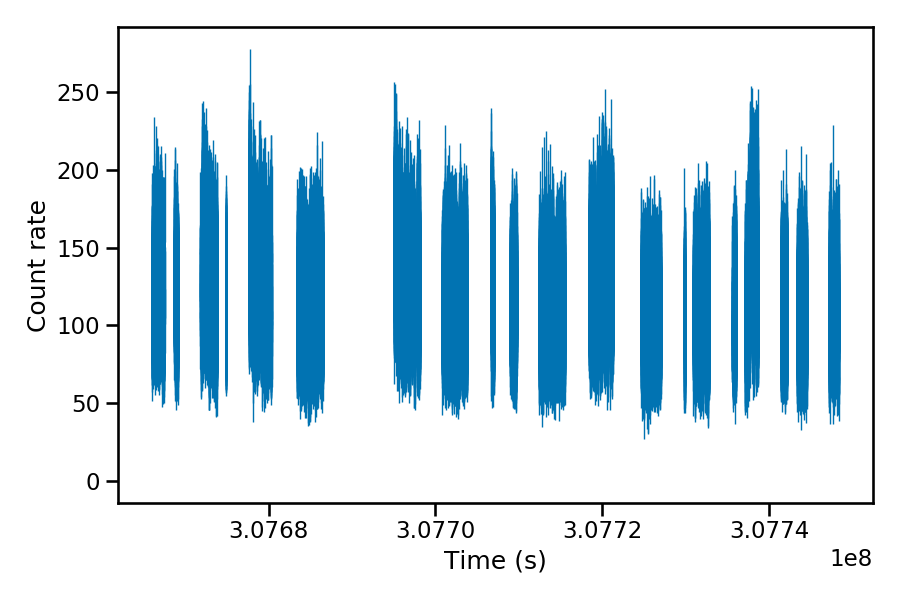

In [4]:
plt.ion()
plt.figure(figsize=(9,6))
plt.errorbar(nuprod_curve.time, nuprod_curve.countrate, xerr = nuprod_curve.dt/2, yerr=nuprod_curve.countrate_err, fmt='none', lw=1.0)
plt.xlabel('Time (s)')
plt.ylabel('Count rate')
plt.tight_layout()
# plt.savefig(plot_dir + 'light_curve_FPMA.pdf')



<IPython.core.display.Javascript object>


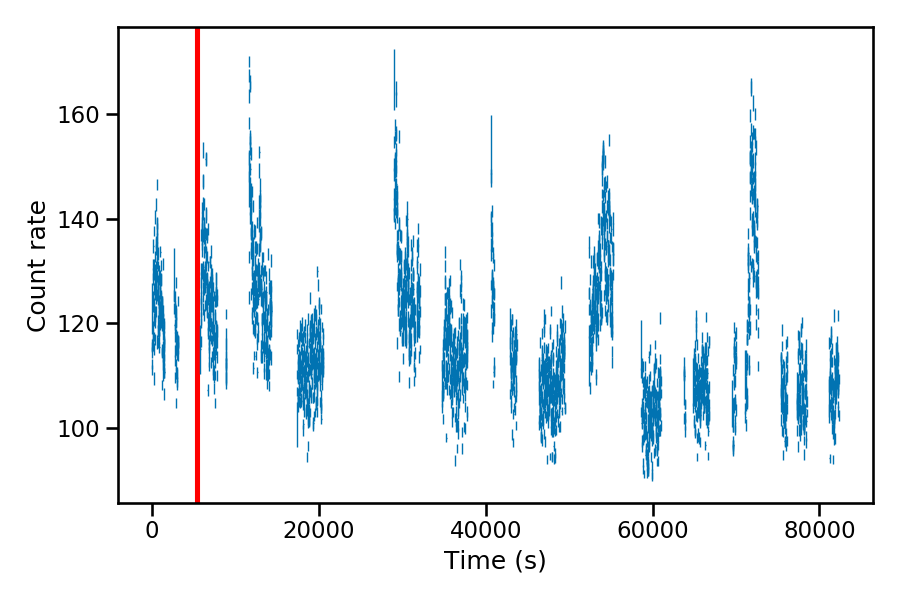

In [5]:
curve_bin = 10
plt.ion()
curve_pretty = nuprod_curve.rebin(curve_bin)
plt.figure(figsize=(9,6))
plt.errorbar(curve_pretty.time-np.min(curve_pretty.time), curve_pretty.countrate, xerr =curve_pretty.dt/2, yerr=curve_pretty.countrate_err, fmt='none', lw=1.0)
plt.xlabel('Time (s)')
plt.ylabel('Count rate')
plt.axvspan(swift_start - np.min(curve_pretty.time), swift_stop - np.min(curve_pretty.time), color='red')
plt.tight_layout()
# plt.savefig(plot_dir + 'light_curve_FPMA.pdf')


In [6]:
split_time = 100
ms_bin = 0.00025
split_A = split_ev_by_time(events[0], bintime = split_time)
curves_A = [x.to_lc(dt = ms_bin) for x in split_A]
split_A = None

split_B = split_ev_by_time(events[1], bintime = split_time)
curves_B = [x.to_lc(dt = ms_bin) for x in split_B]
split_B = None
# curves[0].write(data_dir + 'nu90501343002A01_cl_regfilt_barycorr_buffered_lc_ms.hdf', format_='hdf5')
# curves[1].write(data_dir + 'nu90501343002B01_cl_regfilt_barycorr_buffered_lc_ms.hdf', format_='hdf5')

# curves=[]

# temp_dict = io.read('/Volumes/LaCie/AstroData/J1739-285/nustar/timing/nu90501343002A01_cl_regfilt_tc_bc_buffered_lc_ms.hdf', format_='hdf5')
# curves.append(lc.Lightcurve(time=temp_dict['time'], counts=temp_dict['counts'], gti=temp_dict['gti'], mjdref=temp_dict['mjdref'], dt=temp_dict['dt']))

# temp_dict = io.read('/Volumes/LaCie/AstroData/J1739-285/nustar/timing/nu90501343002B01_cl_regfilt_tc_bc_buffered_lc_ms.hdf', format_='hdf5')
# curves.append(lc.Lightcurve(time=temp_dict['time'], counts=temp_dict['counts'], gti=temp_dict['gti'], mjdref=temp_dict['mjdref'], dt=temp_dict['dt']))

# temp_dict=None


/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/stingray/utils.py:103: UserWarning: SIMON says: Bin sizes in input time array aren't equal throughout! This could cause problems with Fourier transforms. Please make the input time evenly sampled.
  warnings.warn("SIMON says: {0}".format(message), **kwargs)


In [7]:
len(curves_B)

315

## Cospectra

In [8]:
plt.ioff()
cross_spectra = []
for i in range(len(curves_A)):
#     cross = crossspec.Crossspectrum(curves_A[i], curves_B[i]).rebin_log()
    cross = crossspec.Crossspectrum(curves_A[i], curves_B[i], norm='leahy').rebin(df=1)
    cross_spectra.append(cross)
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12,8))
    ax1.errorbar(cross.freq, cross.power.real, xerr=cross.df/2, fmt='')
    ax1.set_xlim(0,2000)
    ax1.axvline(1122, ls='--', color='red')
    ax1.set_xlabel('Frequency (Hz)')
    ax1.set_ylabel('Power')
#     ax1.set_xscale('log')
#     ax1.set_yscale('log')
    ax2.errorbar(curve_pretty.time-np.min(curve_pretty.time), curve_pretty.counts/curve_pretty.dt, yerr=curve_pretty.counts_err/curve_pretty.dt, fmt='none')
    ax2.axvspan(np.min(curves_A[i].time)-np.min(curve_pretty.time),np.max(curves_A[i].time)-np.min(curve_pretty.time),  facecolor='red', alpha = 0.2)
    ax2.set_xlabel('Time (s)')
    ax2.set_ylabel(r'$\mathrm{Count\ rate\ (s^{-1})}$')
    plt.tight_layout()
    plt.savefig(plot_dir + 'cross_spectrum_' + str(split_time) + 's_' + 'segment' + str(i) + '.pdf')  
#     plt.figure(figsize=(9,6))
#     plt.errorbar(cross.freq, cross.power, xerr=cross.df/2, fmt='')
#     plt.axvline(1122, ls='--', color='red')
#     plt.xlim(0,2000)
#     plt.xlabel('Frequency (Hz)')
#     plt.ylabel('Power')
#     plt.tight_layout()
#     plt.savefig(plot_dir + 'cross_spectrum_' + str(split_time) + 's_' + 'segment' + str(i) + '.pdf')
    plt.close()
    
    

/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/stingray/utils.py:103: UserWarning: SIMON says: Errorbars on cross spectra are not thoroughly tested. Please report any inconsistencies.
  warnings.warn("SIMON says: {0}".format(message), **kwargs)
/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/stingray/utils.py:103: UserWarning: SIMON says: Bin sizes in input time array aren't equal throughout! This could cause problems with Fourier transforms. Please make the input time evenly sampled.
  warnings.warn("SIMON says: {0}".format(message), **kwargs)
/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/stingray/utils.py:103: UserWarning: SIMON says: Errorbars on cross spectra are not thoroughly tested. Please report any inconsistencies.
  warnings.warn("SIMON says: {0}".format(message), **kwargs)
/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/stingray/utils.py:103: UserWarning: SIMON says: Bin sizes in input time array aren't equal throughout! This could cause pr

<IPython.core.display.Javascript object>


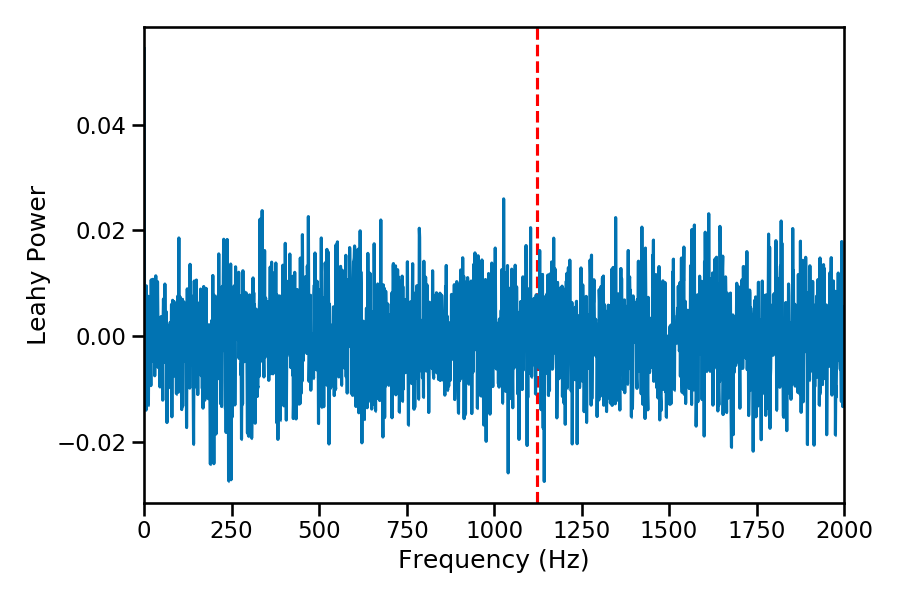

In [32]:
plt.ion()
averaged_cross_freq = cross_spectra[0].freq
averaged_cross_df = cross_spectra[0].df
averaged_cross_power = np.array([0.0 for f in averaged_cross_freq])
for cs in cross_spectra:
    averaged_cross_power = averaged_cross_power + cs.power.real
averaged_cross_power = averaged_cross_power/len(cross_spectra)
# print(averaged_cross_power)
plt.figure(figsize=(9,6))
plt.errorbar(averaged_cross_freq, averaged_cross_power, xerr=averaged_cross_df/2, fmt='')
plt.axvline(1122, ls='--', color='red')
plt.xlim(0,2000)
# plt.xscale('log')
# plt.yscale('log')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Leahy Power')
plt.tight_layout()
# plt.show()
plt.savefig(plot_dir + 'averaged_cross_spectrum_' + str(split_time) + 's.pdf')

<IPython.core.display.Javascript object>


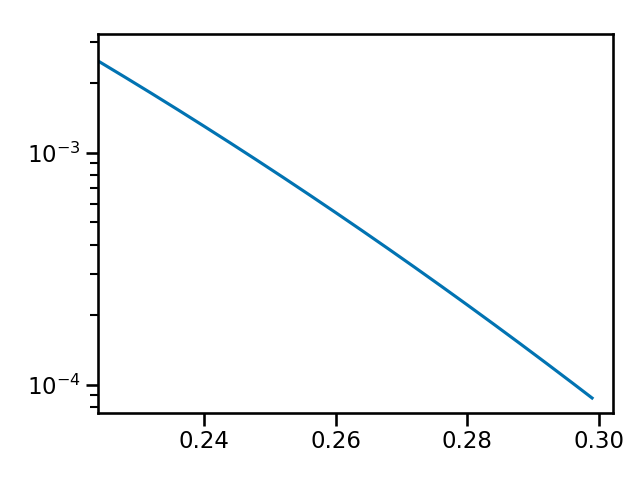

0.025940693877903067
0.3723812414187216


In [51]:
powers = np.arange(-0.04,0.3,0.001)
pvals = calc_pvals(powers, len(curves_B))
plt.plot(powers, pvals)
plt.yscale('log')
plt.tight_layout()

print(np.max(averaged_cross_power[1:]))
print(calc_pvals(np.max(averaged_cross_power[1:]), len(curves_B)))

# HR Intensity

## 3-12 vs 12-50 keV

In [3]:
HR_binsize = 128
buff = 0
total_curve = nuproducts_to_stingray_lc('/disk/lif2/spike/J1739m285/products_3to78keV/nu90501343002A01_sr.lc', buffer=True, rebin=False, buffersize=buff)

soft_curves = [nuproducts_to_stingray_lc('/disk/lif2/spike/J1739m285/products_3to6keV/nu90501343002A01_sr.lc', buffer=True, rebin=False, buffersize=buff), \
               nuproducts_to_stingray_lc('/disk/lif2/spike/J1739m285/products_6to12keV/nu90501343002A01_sr.lc', buffer=True, rebin=False, buffersize=buff)]

hard_curves = [nuproducts_to_stingray_lc('/disk/lif2/spike/J1739m285/products_12to25keV/nu90501343002A01_sr.lc', buffer=True, rebin=False, buffersize=buff), \
               nuproducts_to_stingray_lc('/disk/lif2/spike/J1739m285/products_25to50keV/nu90501343002A01_sr.lc', buffer=True, rebin=False, buffersize=buff)]

soft_total = nuproducts_to_stingray_lc('/disk/lif2/spike/J1739m285/products_3to12keV/nu90501343002A01_sr.lc', buffer=True, rebin=False, buffersize=buff)
hard_total = nuproducts_to_stingray_lc('/disk/lif2/spike/J1739m285/products_12to50keV/nu90501343002A01_sr.lc', buffer=True, rebin=False, buffersize=buff)

# print(soft_curves[1].time == soft_curves[0].time)

common_time = total_curve.time
soft_color = (soft_curves[1].counts - soft_curves[0].counts)/(soft_curves[1].counts + soft_curves[0].counts)
soft_err = (1.0/(soft_curves[1].counts + soft_curves[0].counts))*np.sqrt(np.square((1.0-soft_color) * soft_curves[1].counts_err) + np.square((1.0+soft_color) * soft_curves[0].counts_err))

hard_color = (hard_curves[1].countrate - hard_curves[0].countrate)/(hard_curves[1].countrate + hard_curves[0].countrate)
hard_err = (1.0/(hard_curves[1].countrate + hard_curves[0].countrate))*np.sqrt(np.square((1.0-hard_color) * hard_curves[1].countrate_err) + np.square((1.0+hard_color) * hard_curves[0].countrate_err))

HR = (hard_total.countrate - soft_total.countrate)/(hard_total.countrate + soft_total.countrate)
HR_err = (1.0/(hard_total.countrate + soft_total.countrate))*np.sqrt(np.square((1.0-HR) * hard_total.countrate_err) + np.square((1.0+HR) * soft_total.countrate_err))
plt.ion()


<IPython.core.display.Javascript object>


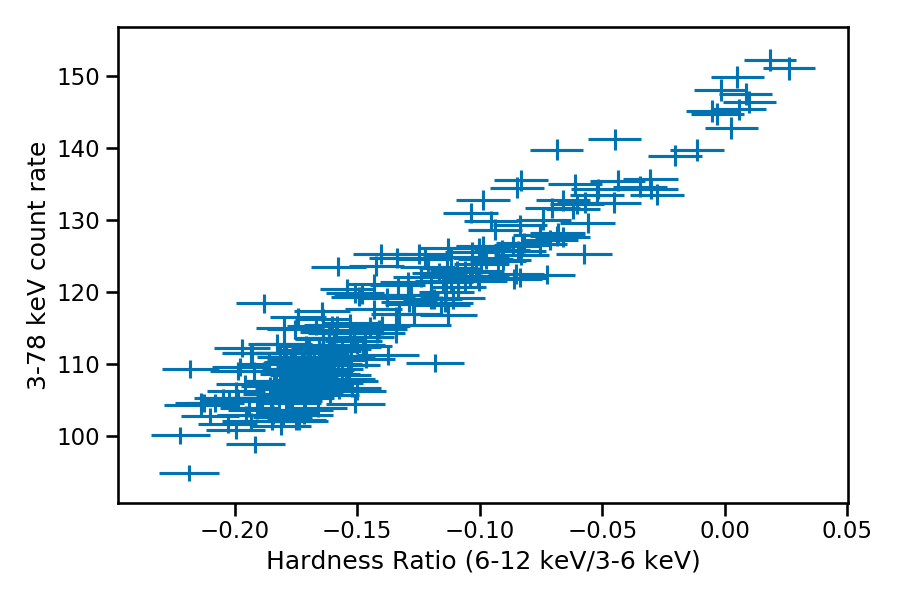

-0.22217187
0.026132634
0.011645576


In [5]:
soft_bins = [[-0.223, -0.18], [-0.18, -0.155], [-0.155, -0.13], [-0.13, -0.095], [-0.095, -0.06],[-0.06, -0.023], [-0.023, 0.03]]
# edge = np.min(soft_color)
# while edge < np.max(soft_color):
#     soft_bins.append([edge, edge + 3*np.mean(soft_err)])
#     edge += 3*np.mean(soft_err)
# print(soft_bins)

plt.figure(figsize=(9,6))
plt.errorbar(soft_color, total_curve.countrate, xerr = soft_err, yerr=total_curve.countrate_err, fmt='none')
plt.xlabel('Hardness Ratio (6-12 keV/3-6 keV)')
plt.ylabel('3-78 keV count rate')
# for b in soft_bins:
#     plt.axvline(b[0], color='red')
# plt.axvline(soft_bins[-1][1], color='red')
plt.tight_layout()
print(np.min(soft_color))
print(np.max(soft_color))
print(np.mean(soft_err))

<IPython.core.display.Javascript object>


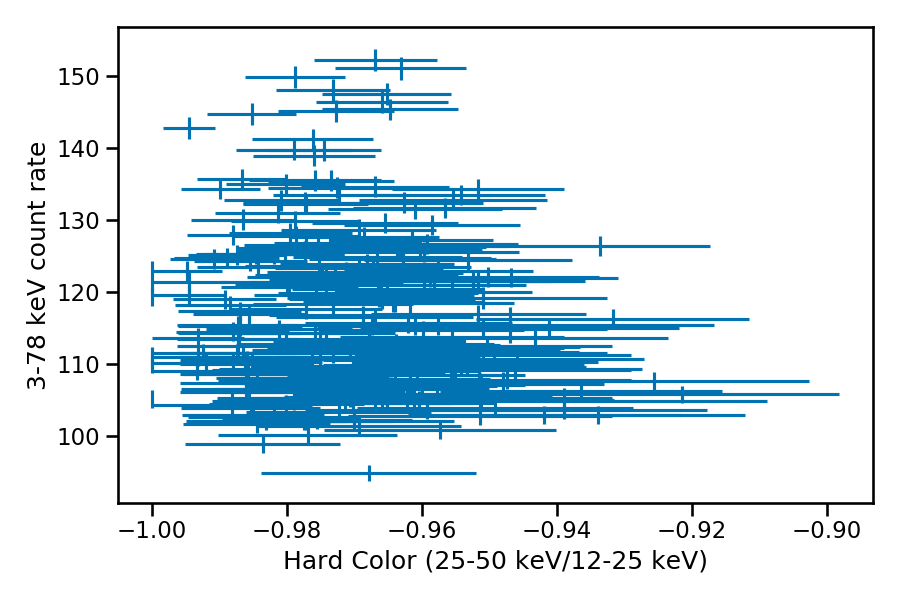

In [16]:
plt.figure(figsize=(9,6))
plt.errorbar(hard_color, total_curve.countrate, xerr = hard_err, yerr=total_curve.countrate_err, fmt='none')
plt.xlabel('Hard Color (25-50 keV/12-25 keV)')
plt.ylabel('3-78 keV count rate')
plt.tight_layout()

<IPython.core.display.Javascript object>


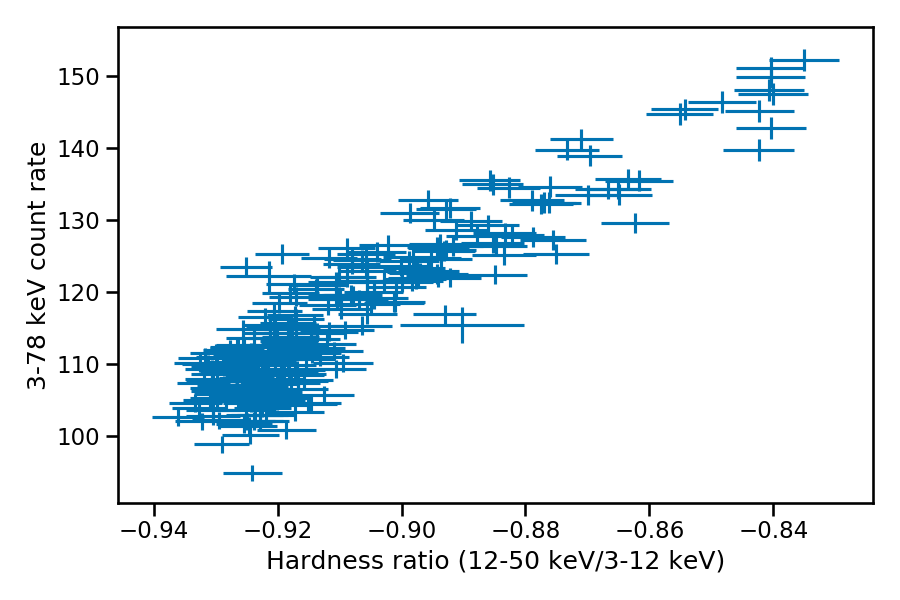

In [5]:
plt.figure(figsize=(9,6))
plt.errorbar(HR, total_curve.counts/total_curve.dt, xerr = HR_err, yerr=total_curve.counts_err/total_curve.dt, fmt='none')
plt.xlabel('Hardness ratio (12-50 keV/3-12 keV)')
plt.ylabel('3-78 keV count rate')
plt.tight_layout()

<IPython.core.display.Javascript object>


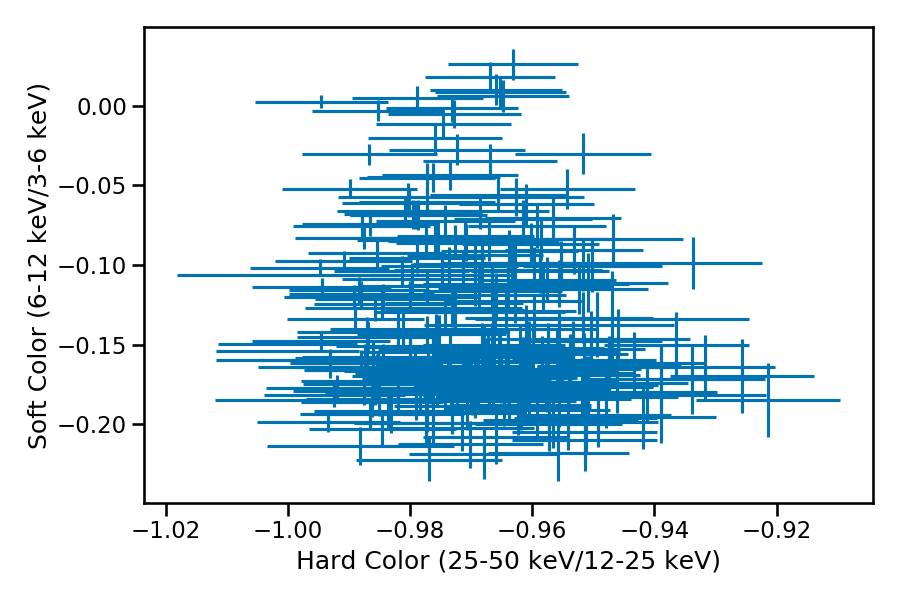

In [18]:
plt.figure(figsize=(9,6))
plt.errorbar(hard_color, soft_color, xerr = soft_err, yerr=hard_err, fmt='none')
plt.xlabel('Hard Color (25-50 keV/12-25 keV)')
plt.ylabel('Soft Color (6-12 keV/3-6 keV)')
plt.tight_layout()



<IPython.core.display.Javascript object>


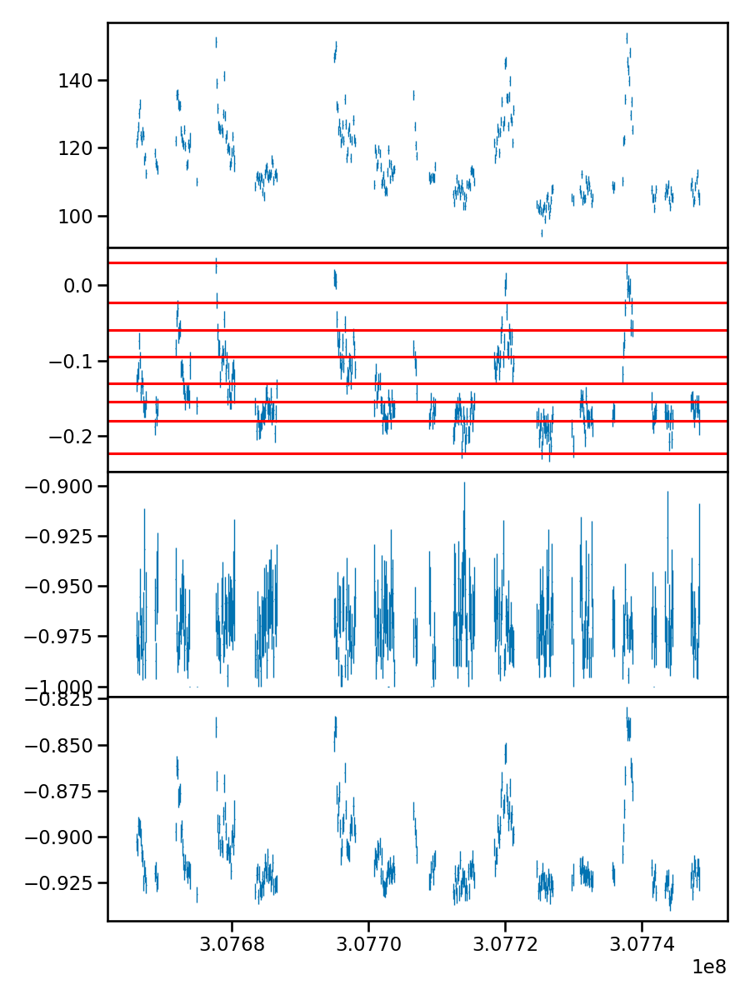

In [6]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=4, ncols=1, figsize=(9,12), sharex=True, gridspec_kw = {'height_ratios':[1,1,1,1], 'hspace':0})
ax1.errorbar(total_curve.time, total_curve.countrate, xerr = total_curve.dt/2, yerr=total_curve.countrate_err, fmt='none', lw=1.0)
ax2.errorbar(total_curve.time, soft_color, xerr = total_curve.dt/2, yerr=soft_err, fmt='none', lw=1.0)
ax3.errorbar(total_curve.time, hard_color, xerr = total_curve.dt/2, yerr=hard_err, fmt='none', lw=1.0)
ax4.errorbar(total_curve.time, HR, xerr = total_curve.dt/2, yerr=HR_err, fmt='none', lw=1.0)

for b in soft_bins:
    ax2.axhline(b[0], color='red')
ax2.axhline(soft_bins[-1][1], color='red')

plt.tight_layout()






## Making GTI's based on soft color

<IPython.core.display.Javascript object>


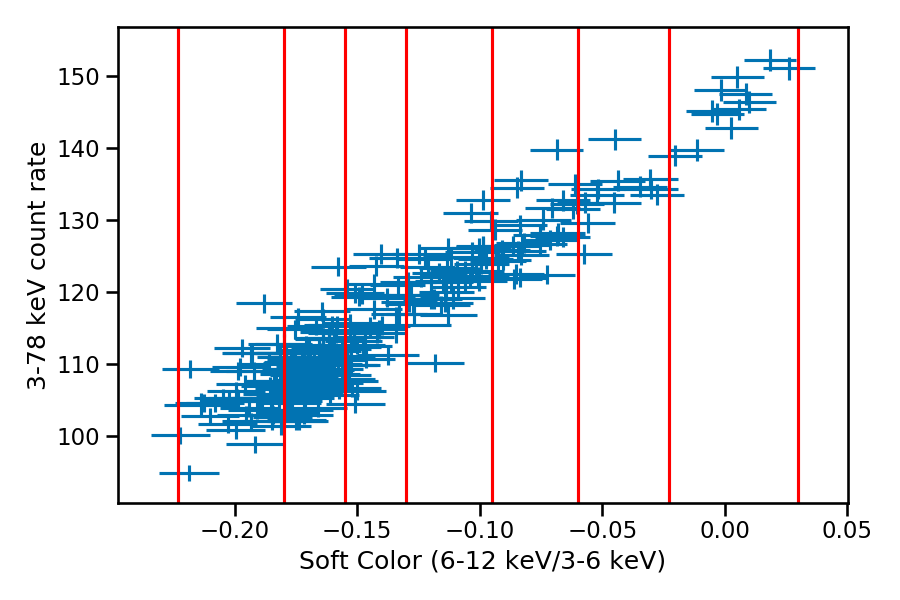

-0.22217187
0.026132634
0.011645576


In [7]:
soft_bins = [[-0.223, -0.18], [-0.18, -0.155], [-0.155, -0.13], [-0.13, -0.095], [-0.095, -0.06],[-0.06, -0.023], [-0.023, 0.03]]
# edge = np.min(soft_color)
# while edge < np.max(soft_color):
#     soft_bins.append([edge, edge + 3*np.mean(soft_err)])
#     edge += 3*np.mean(soft_err)
# print(soft_bins)

plt.figure(figsize=(9,6))
plt.errorbar(soft_color, total_curve.countrate, xerr = soft_err, yerr=total_curve.countrate_err, fmt='none')
plt.xlabel('Soft Color (6-12 keV/3-6 keV)')
plt.ylabel('3-78 keV count rate')
for b in soft_bins:
    plt.axvline(b[0], color='red')
plt.axvline(soft_bins[-1][1], color='red')
plt.tight_layout()
print(np.min(soft_color))
print(np.max(soft_color))
print(np.mean(soft_err))

<IPython.core.display.Javascript object>


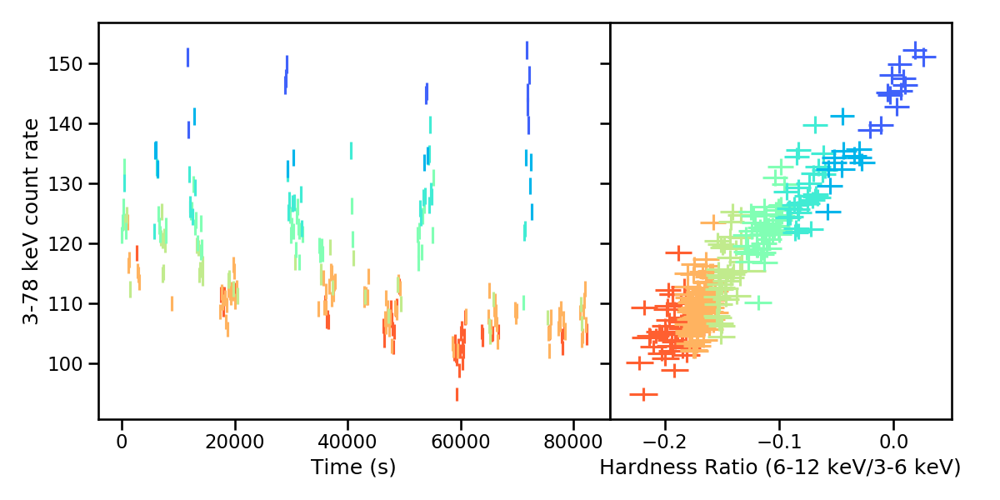

In [65]:
palette = reversed(sns.color_palette('rainbow', 7))
sns.set_palette(palette, 7)

fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12,6), sharey=True, gridspec_kw = {'width_ratios':[3,2], 'wspace':0})
for k, b in enumerate(soft_bins):
    soft_mask = (soft_color < b[1]) * (soft_color >= b[0])
    ax1.errorbar((total_curve.time-np.min(total_curve.time))[soft_mask], total_curve.countrate[soft_mask], \
                 xerr = total_curve.dt/2, yerr=total_curve.countrate_err[soft_mask], color = 'C'+str(k), fmt='none')
    ax2.errorbar(soft_color[soft_mask], total_curve.countrate[soft_mask], xerr = soft_err[soft_mask], \
                 yerr=total_curve.countrate_err[soft_mask],color = 'C'+str(k), fmt='none')
    ax2.set_xlabel('Hardness Ratio (6-12 keV/3-6 keV)')

# ax2.yaxis.tick_right()
ax2.tick_params(axis='y', which='right', labelright='on')
ax1.set_ylabel('3-78 keV count rate')
ax1.set_xlabel('Time (s)')
plt.tight_layout()
plt.savefig(plot_dir + 'lightcurve_softcolor.pdf')


<IPython.core.display.Javascript object>


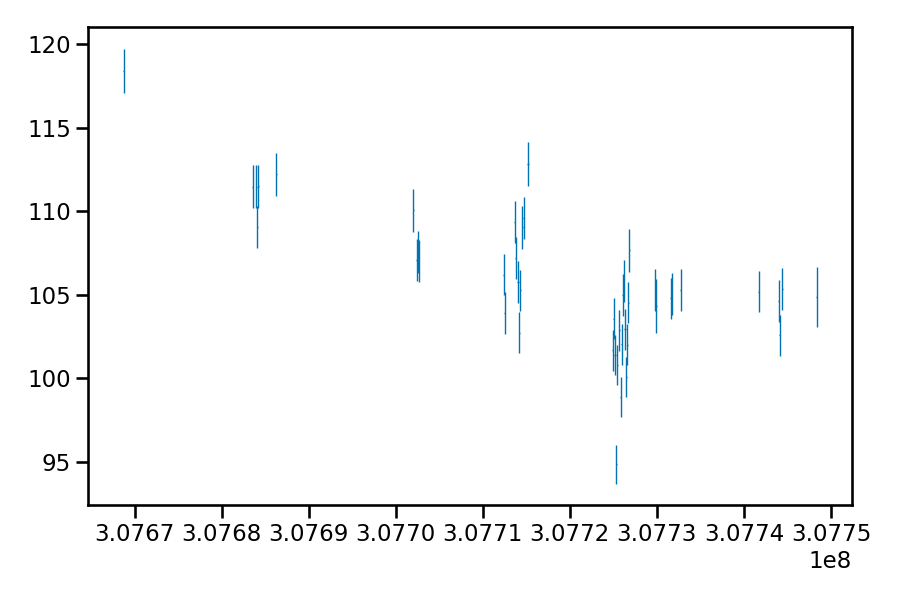

<IPython.core.display.Javascript object>


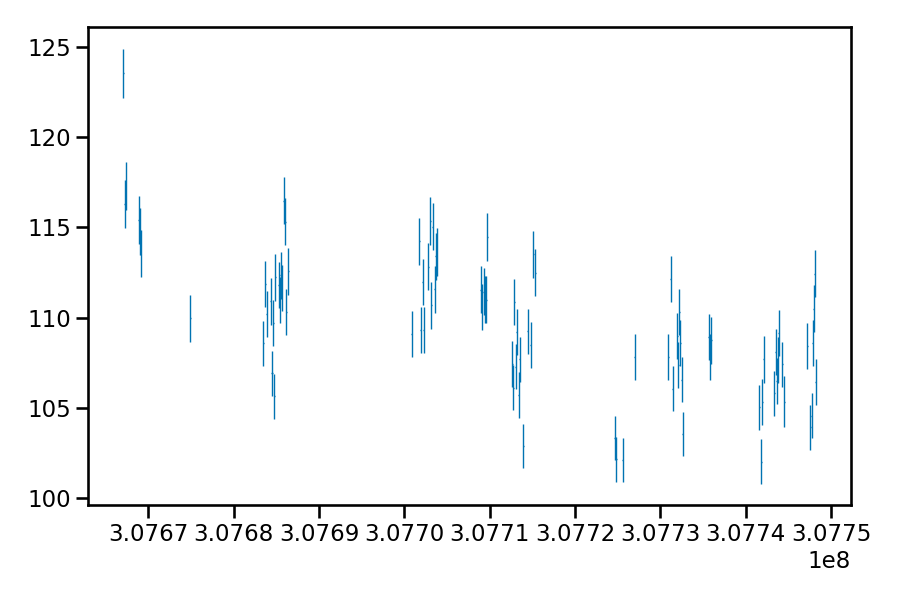

<IPython.core.display.Javascript object>


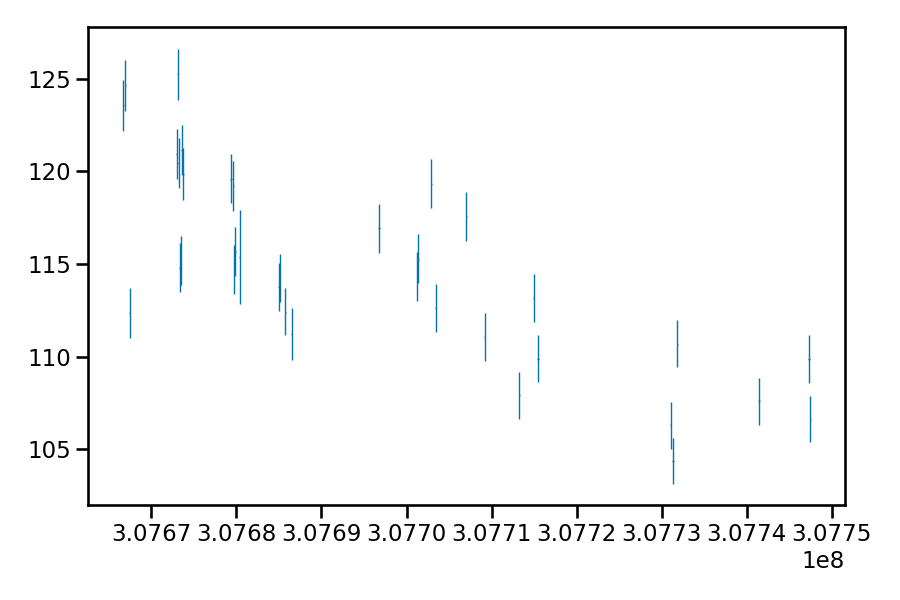

<IPython.core.display.Javascript object>


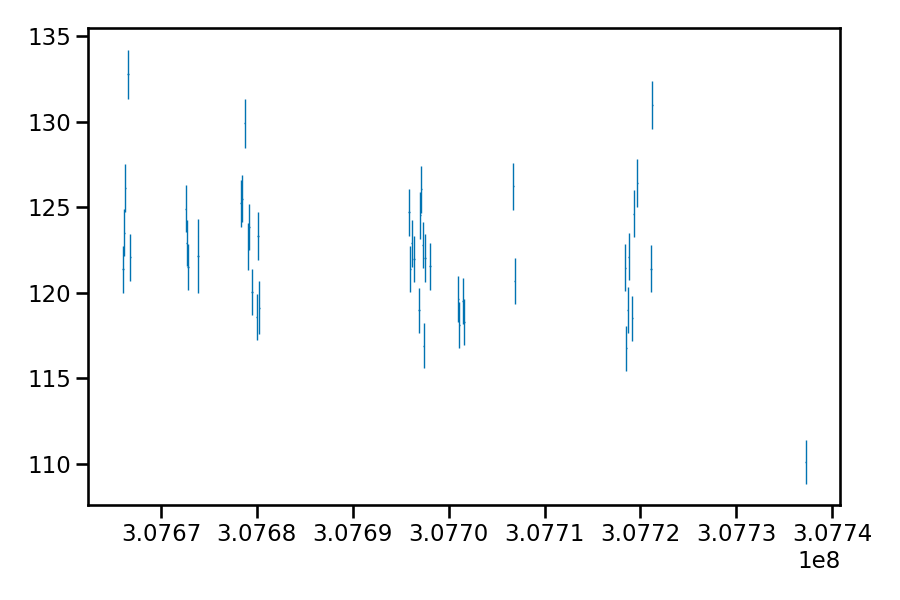

<IPython.core.display.Javascript object>


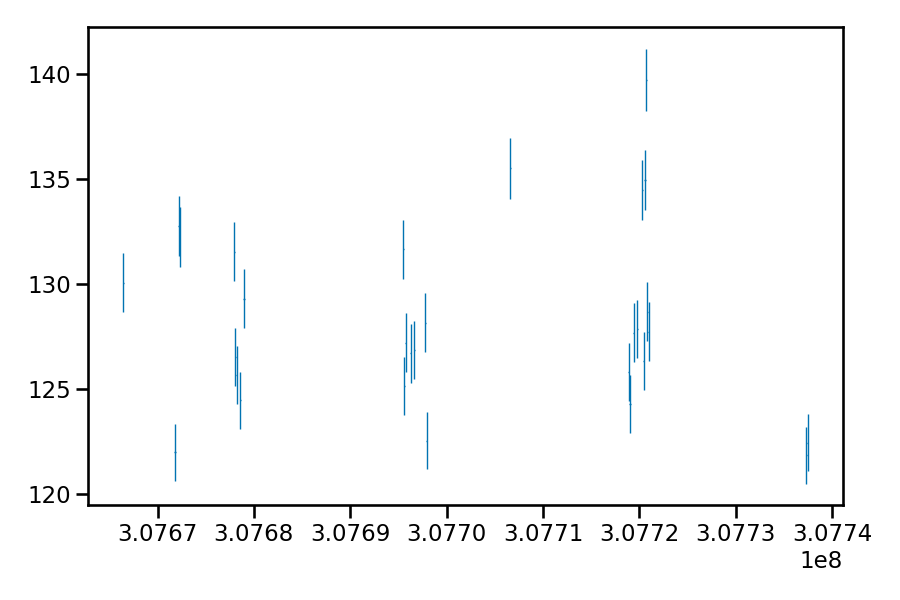

<IPython.core.display.Javascript object>


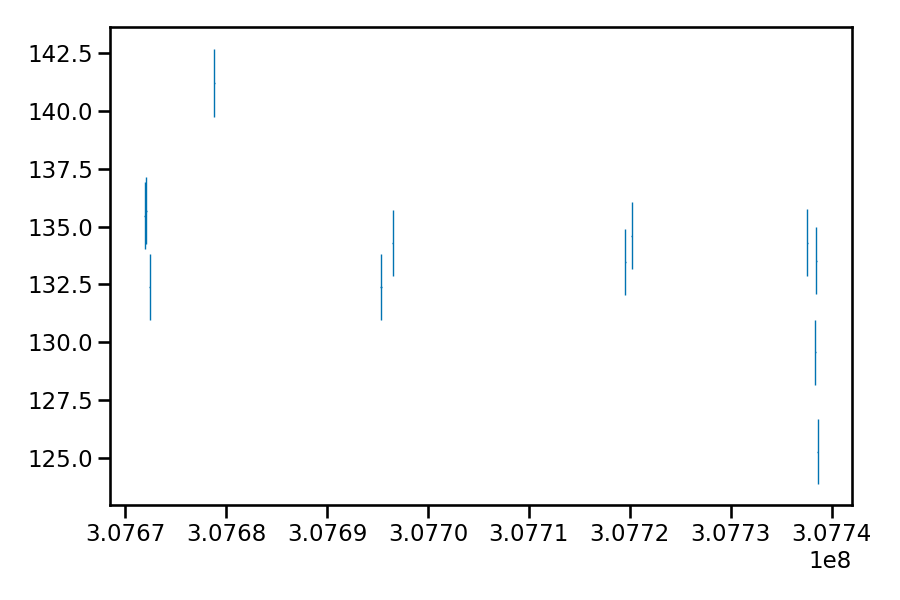

<IPython.core.display.Javascript object>


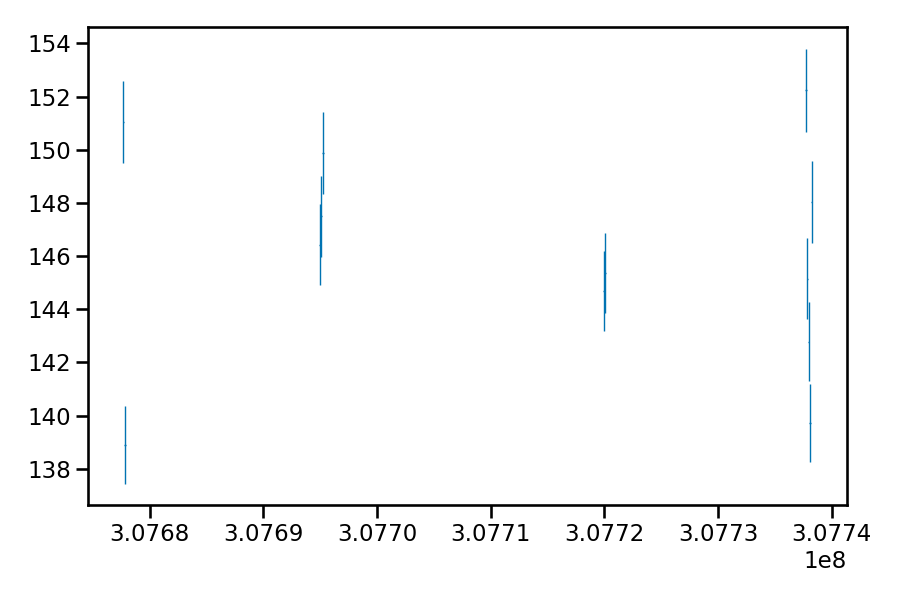

[[[307668672.0, 307668800.0], [307683520.0, 307683648.0], [307683904.0, 307684288.0], [307686208.0, 307686336.0], [307701952.0, 307702080.0], [307702336.0, 307702720.0], [307712320.0, 307712576.0], [307713600.0, 307713856.0], [307713984.0, 307714368.0], [307714496.0, 307714752.0], [307715136.0, 307715264.0], [307724864.0, 307725504.0], [307725632.0, 307726912.0], [307729728.0, 307729984.0], [307731520.0, 307731776.0], [307732672.0, 307732800.0], [307741632.0, 307741760.0], [307743936.0, 307744192.0], [307744320.0, 307744448.0], [307748288.0, 307748416.0]], [[307667008.0, 307667392.0], [307668800.0, 307669184.0], [307674816.0, 307674944.0], [307683392.0, 307683520.0], [307683648.0, 307683904.0], [307684288.0, 307684928.0], [307685184.0, 307685696.0], [307685824.0, 307686208.0], [307686336.0, 307686464.0], [307700800.0, 307700928.0], [307701696.0, 307701952.0], [307702080.0, 307702336.0], [307702720.0, 307702848.0], [307702976.0, 307703360.0], [307703488.0, 307703872.0], [307708864.0, 30

In [9]:
soft_gti = []
for b in soft_bins:
    soft_mask = (soft_color < b[1]) * (soft_color >= b[0])
    masked_times = total_curve.time[soft_mask]
    temp_gti = []
    start = masked_times[0]-64.0
    end = masked_times[0]+64.0
    for t in masked_times[1:]:
        if not np.abs(t-64.0 - end) < 10.0:
            temp_gti.append([start, end])
            start = t-64.0
        end = t + 64.0
    temp_gti.append([start, end])
    soft_gti.append(temp_gti)
    plt.figure(figsize=(9,6))
    plt.errorbar(total_curve.time[soft_mask], total_curve.countrate[soft_mask], xerr = total_curve.dt/2, yerr=total_curve.countrate_err[soft_mask], fmt='none', lw=1.0)
    plt.tight_layout()


print(soft_gti)
    

In [10]:
gti_sum = 0
name_list = ['soft_soft', 'soft', 'soft_mid', 'mid', 'hard_mid', 'hard', 'hard_hard']
for i, x in enumerate(soft_gti):
    print(np.array(x))
#     print(np.array(x).T[0])
#     print(np.array(x).T[1])
    col1 = fits.Column(name='START', format='D', array=np.array(x).T[0])
    col2 = fits.Column(name='STOP', format='D', array=np.array(x).T[1])
    coldefs = fits.ColDefs([col1, col2])
    hdu = fits.BinTableHDU.from_columns(coldefs, name='GTI')
#     hdu.writeto('/disk/lif2/spike/J1739m285/' + name_list[i] + '.gti', overwrite=True)
    for g in x:
#         print(g[1]-g[0])
        gti_sum += g[1]-g[0]
# print(gti_sum) 
# print(128*len(total_curve.time))

[[3.07668672e+08 3.07668800e+08]
 [3.07683520e+08 3.07683648e+08]
 [3.07683904e+08 3.07684288e+08]
 [3.07686208e+08 3.07686336e+08]
 [3.07701952e+08 3.07702080e+08]
 [3.07702336e+08 3.07702720e+08]
 [3.07712320e+08 3.07712576e+08]
 [3.07713600e+08 3.07713856e+08]
 [3.07713984e+08 3.07714368e+08]
 [3.07714496e+08 3.07714752e+08]
 [3.07715136e+08 3.07715264e+08]
 [3.07724864e+08 3.07725504e+08]
 [3.07725632e+08 3.07726912e+08]
 [3.07729728e+08 3.07729984e+08]
 [3.07731520e+08 3.07731776e+08]
 [3.07732672e+08 3.07732800e+08]
 [3.07741632e+08 3.07741760e+08]
 [3.07743936e+08 3.07744192e+08]
 [3.07744320e+08 3.07744448e+08]
 [3.07748288e+08 3.07748416e+08]]
[[3.07667008e+08 3.07667392e+08]
 [3.07668800e+08 3.07669184e+08]
 [3.07674816e+08 3.07674944e+08]
 [3.07683392e+08 3.07683520e+08]
 [3.07683648e+08 3.07683904e+08]
 [3.07684288e+08 3.07684928e+08]
 [3.07685184e+08 3.07685696e+08]
 [3.07685824e+08 3.07686208e+08]
 [3.07686336e+08 3.07686464e+08]
 [3.07700800e+08 3.07700928e+08]
 [3.07701

# Plotting Spectra and Hardness

In [6]:
lw = 1.5
ls=''

file_eeufspec = open('/disk/lif2/spike/J1739m285/sim_states_fitting/tbabs_diskbb_bb_relxillNS_eeufspec.qdp', 'r')
file_chi = open('/disk/lif2/spike/J1739m285/sim_states_fitting/tbabs_diskbb_bb_relxillNS_chi.qdp', 'r')
file_ratio = open('/disk/lif2/spike/J1739m285/sim_states_fitting/tbabs_diskbb_bb_relxillNS_ratio.qdp', 'r')
file_model = open('/disk/lif2/spike/J1739m285/sim_states_fitting/tbabs_diskbb_bb_relxillNS_model.qdp', 'r')

data_eeufspec = read_QDP(file_eeufspec)
data_chi = read_QDP(file_chi)
data_ratio = read_QDP(file_ratio)
data_model = read_QDP(file_model)

file_noref = open('/disk/lif2/spike/J1739m285/products/tbabs_diskbb_bb_eeufspec.qdp', 'r')
file_relline = open('/disk/lif2/spike/J1739m285/products/tbabs_diskbb_bb_relline_eeufspec.qdp', 'r')
file_noref_cutoffpl = open('/disk/lif2/spike/J1739m285/products/tbabs_diskbb_cutoffpl_eeufspec.qdp', 'r')
file_ldata = open('/disk/lif2/spike/J1739m285/products/ldata.qdp', 'r')
file_meanspec = open('/disk/lif2/spike/J1739m285/products/tbabs_diskbb_bb_relxillNS_eeufspec.qdp', 'r')

data_noref = read_QDP(file_noref)
data_relline = read_QDP(file_relline)
data_ldata = read_QDP(file_ldata)
data_noref_cutoffpl = read_QDP(file_noref_cutoffpl)
data_meanspec = read_QDP(file_meanspec)

file_cutoffpl_relxill = open('/disk/lif2/spike/J1739m285/products/tbabs_cutoffpl_relxill_eeufspec.qdp', 'r')
file_cutoffpl_relxill_gabs = open('/disk/lif2/spike/J1739m285/products/gabs_tbabs_cutoffpl_relxill_eeufspec.qdp', 'r')
file_cutoffpl_only = open('/disk/lif2/spike/J1739m285/products/tbabs_cutoffpl_eeufspec.qdp', 'r')
file_model_cutoffpl = open('/disk/lif2/spike/J1739m285/sim_states_fitting/gabs_tbabs_cutoffpl_relxill_model.qdp', 'r')
file_eeufspec_cutoffpl = open('/disk/lif2/spike/J1739m285/sim_states_fitting/gabs_tbabs_cutoffpl_relxill_eeufspec.qdp', 'r')

data_cutoffpl_relxill = read_QDP(file_cutoffpl_relxill)
data_cutoffpl_relxill_gabs = read_QDP(file_cutoffpl_relxill_gabs)
data_cutoffpl_only = read_QDP(file_cutoffpl_only)
data_model_cutoffpl = read_QDP(file_model_cutoffpl)
data_eeufspec_cutoffpl = read_QDP(file_eeufspec_cutoffpl)


<IPython.core.display.Javascript object>


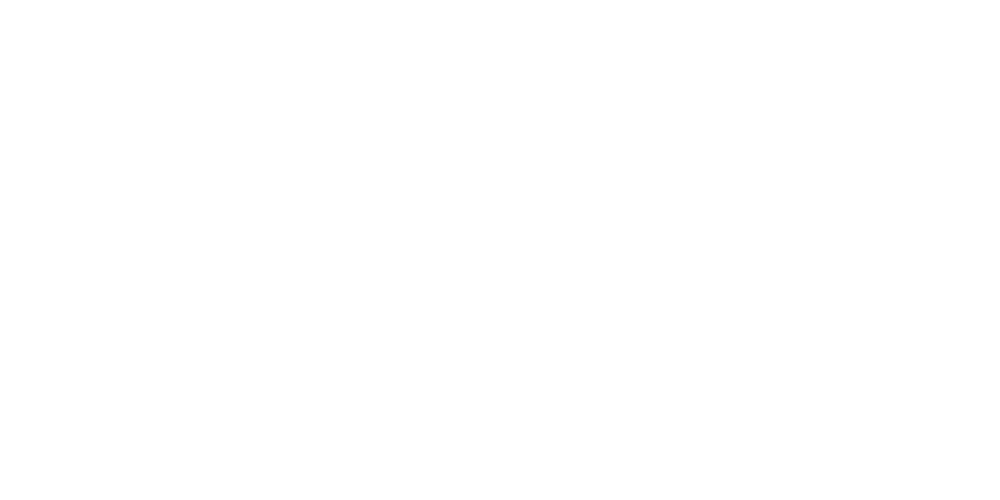

/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  app.launch_new_instance()


<IPython.core.display.Javascript object>


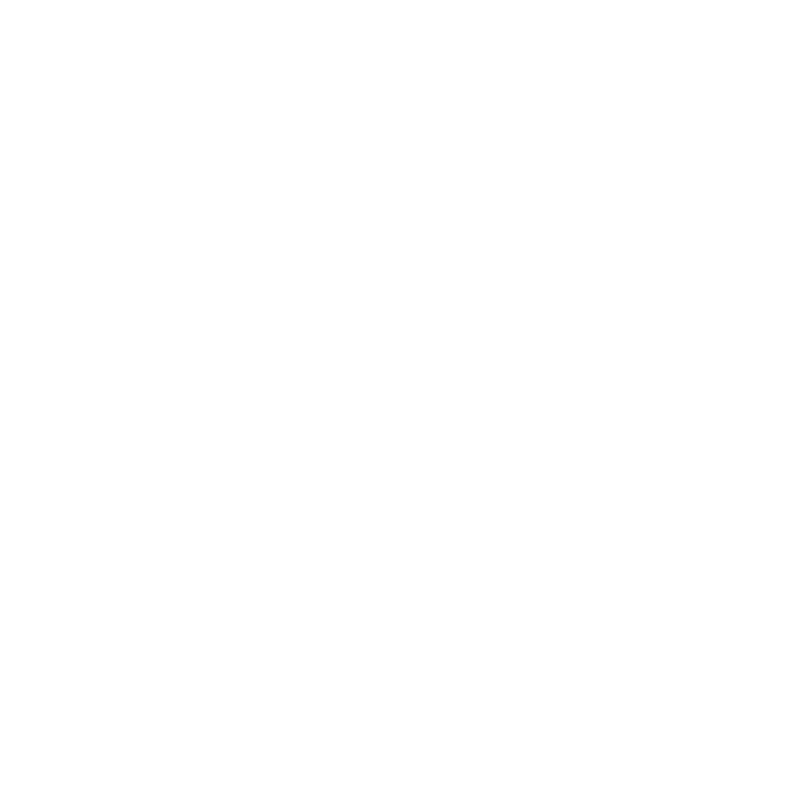

/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:48: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).


In [95]:
# When plotting QDP, the 0th column is X, 1st is X error, 2nd is Y, 3rd is Y error, and 4th is the model
label_list = ['Extra Soft', 'Soft', 'Soft-mid', 'Mid', 'Hard-mid', 'Hard', 'Extra Hard']
name_list = ['soft_soft', 'soft', 'soft_mid', 'mid', 'hard_mid', 'hard', 'hard_hard']

palette = reversed(sns.color_palette('rainbow', 7))
sns.set_palette(palette, 7)
plt.figure(figsize=(10,5))
lw = 1.5
# ls = 'steps'
ls=''
for i in range(len(data_eeufspec)):
    if not i%2:
        plt.errorbar(data_eeufspec[i][0],data_eeufspec[i][2], xerr=data_eeufspec[i][1], yerr=data_eeufspec[i][3], \
                     ls=ls, lw=lw, color='C' + str(int(i/2)), label = label_list[int(i/2)])
        plt.errorbar(data_eeufspec[i][0],data_eeufspec[i][4], xerr=data_eeufspec[i][1], \
                     ls='steps-mid', color='C' + str(int(i/2)), lw=lw)

# for i in range(len(data_pl)):
#     plt.errorbar(data_pl[i][0],data_pl[i][2], xerr=data_pl[i][1], yerr=data_pl[i][3], \
#                  ls =ls, color='C' + str(int(len(data_sim) + i)), lw=lw, label='0780950201')

# for i in range(len(data_high)):
#     plt.errorbar(data_high[i][0],data_high[i][2], xerr=data_high[i][1], yerr=data_high[i][3], \
#                  ls =ls, color='magenta', lw=lw, label='0824450301')
    
# plt.legend()
plt.loglog()
plt.xlim((3.0,25.0))
plt.ylim((0.1,2.5))
plt.gca().xaxis.set_major_formatter(ScalarFormatter())
plt.gca().xaxis.set_minor_formatter(ScalarFormatter())
plt.xticks([10.0], ['10'])
plt.xlabel('Energy (keV)')
plt.ylabel(r'$\mathrm{EF_E\ [keV^{2}(\gamma\,cm^{-2}\,s^{-1}\,keV^{-1})]}$')
plt.tight_layout()
plt.savefig(plot_dir + 'all_states_FPMA_eeufspec.pdf')
plt.close()

plt.figure(figsize=(8,8))
lw = 1.0
# ls = 'steps'
ls=''
for i in range(len(data_eeufspec)):
    if not i%2:
        plt.errorbar(data_eeufspec[i][0],data_eeufspec[i][2], xerr=data_eeufspec[i][1], yerr=data_eeufspec[i][3], \
                     ls=ls, lw=lw, color='C' + str(int(i/2)), label = label_list[int(i/2)])
        plt.errorbar(data_eeufspec[i][0],data_eeufspec[i][4], xerr=data_eeufspec[i][1], \
                     ls='steps-mid', color='C' + str(int(i/2)), lw=lw)

# for i in range(len(data_pl)):
#     plt.errorbar(data_pl[i][0],data_pl[i][2], xerr=data_pl[i][1], yerr=data_pl[i][3], \
#                  ls =ls, color='C' + str(int(len(data_sim) + i)), lw=lw, label='0780950201')

# for i in range(len(data_high)):
#     plt.errorbar(data_high[i][0],data_high[i][2], xerr=data_high[i][1], yerr=data_high[i][3], \
#                  ls =ls, color='magenta', lw=lw, label='0824450301')
    
# plt.legend()
plt.loglog()
plt.xlim((3.0,25.0))
plt.ylim((0.1,2.5))
plt.gca().xaxis.set_major_formatter(ScalarFormatter())
plt.xticks([10.0], ['10'])
plt.gca().xaxis.set_minor_formatter(ScalarFormatter())
plt.xlabel('Energy (keV)')
plt.ylabel(r'$\mathrm{EF_E\ [keV^{2}(\gamma\,cm^{-2}\,s^{-1}\,keV^{-1})]}$')
plt.tight_layout()
plt.savefig(plot_dir + 'all_states_FPMA_eeufspec_tall.pdf')
plt.close()



<IPython.core.display.Javascript object>


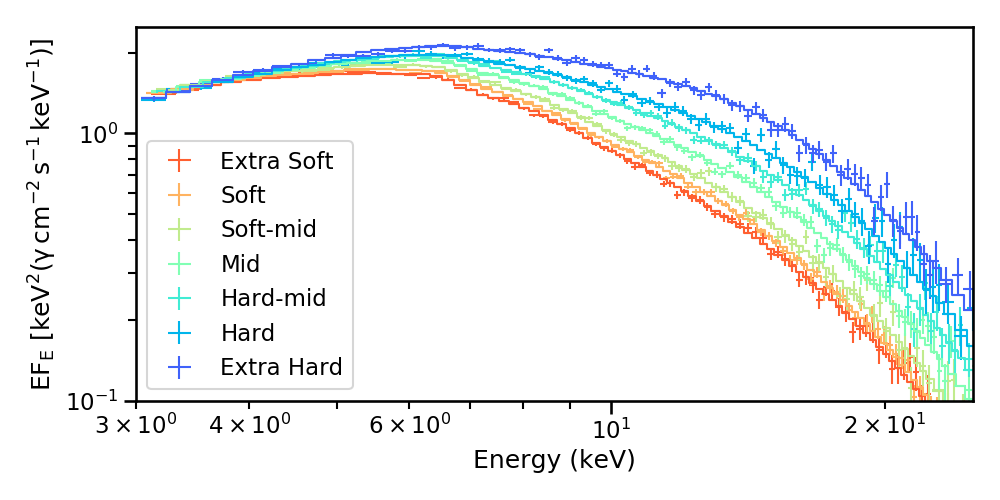

/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  app.launch_new_instance()


In [8]:
# When plotting QDP, the 0th column is X, 1st is X error, 2nd is Y, 3rd is Y error, and 4th is the model
label_list = ['Extra Soft', 'Soft', 'Soft-mid', 'Mid', 'Hard-mid', 'Hard', 'Extra Hard']
name_list = ['soft_soft', 'soft', 'soft_mid', 'mid', 'hard_mid', 'hard', 'hard_hard']

palette = reversed(sns.color_palette('rainbow', 7))
sns.set_palette(palette, 7)
plt.figure(figsize=(10,5))
lw = 1.5
# ls = 'steps'
ls=''
for i in range(len(data_eeufspec)):
    if not i%2:
        plt.errorbar(data_eeufspec[i][0],data_eeufspec[i][2], xerr=data_eeufspec[i][1], yerr=data_eeufspec[i][3], \
                     ls=ls, lw=lw, color='C' + str(int(i/2)), label = label_list[int(i/2)])
        plt.errorbar(data_eeufspec[i][0],data_eeufspec[i][4], xerr=data_eeufspec[i][1], \
                     ls='steps-mid', color='C' + str(int(i/2)), lw=lw)

# for i in range(len(data_pl)):
#     plt.errorbar(data_pl[i][0],data_pl[i][2], xerr=data_pl[i][1], yerr=data_pl[i][3], \
#                  ls =ls, color='C' + str(int(len(data_sim) + i)), lw=lw, label='0780950201')

# for i in range(len(data_high)):
#     plt.errorbar(data_high[i][0],data_high[i][2], xerr=data_high[i][1], yerr=data_high[i][3], \
#                  ls =ls, color='magenta', lw=lw, label='0824450301')
    
plt.legend()
plt.loglog()
plt.xlim((3.0,25.0))
plt.ylim((0.1,2.5))
plt.xlabel('Energy (keV)')
plt.ylabel(r'$\mathrm{EF_E\ [keV^{2}(\gamma\,cm^{-2}\,s^{-1}\,keV^{-1})]}$')
plt.tight_layout()
plt.savefig(plot_dir + 'all_states_FPMA_cutoffpl_eeufspec.pdf')
# plt.close()



<IPython.core.display.Javascript object>


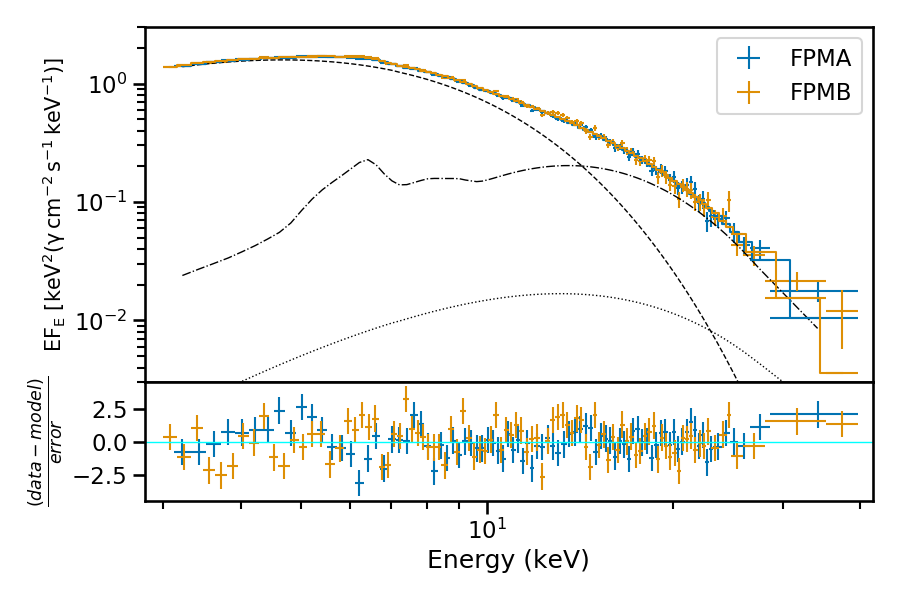

/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  # This is added back by InteractiveShellApp.init_path()
/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  from ipykernel import kernelapp as app


<IPython.core.display.Javascript object>


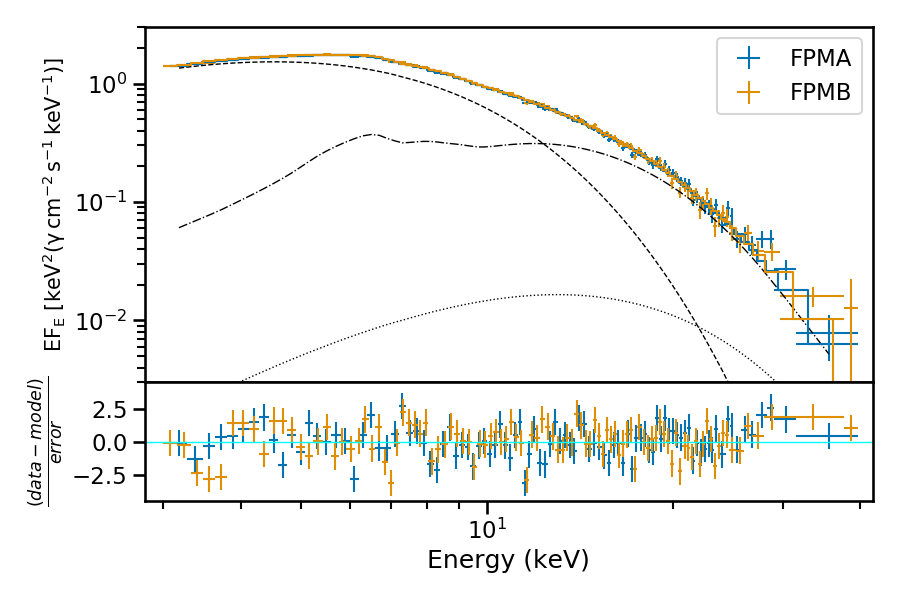

/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  # This is added back by InteractiveShellApp.init_path()
/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  from ipykernel import kernelapp as app


<IPython.core.display.Javascript object>


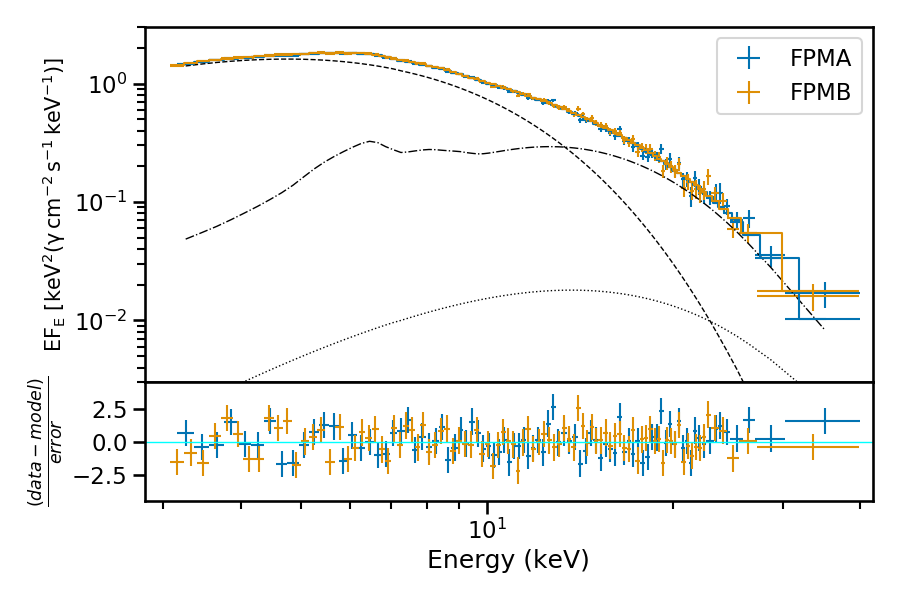

/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  # This is added back by InteractiveShellApp.init_path()
/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  from ipykernel import kernelapp as app


<IPython.core.display.Javascript object>


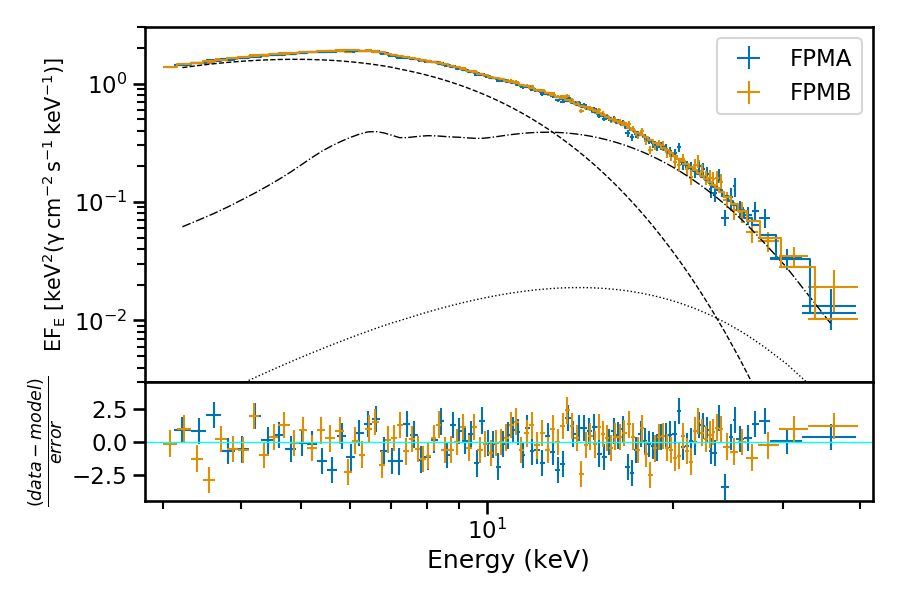

/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  # This is added back by InteractiveShellApp.init_path()
/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  from ipykernel import kernelapp as app


<IPython.core.display.Javascript object>


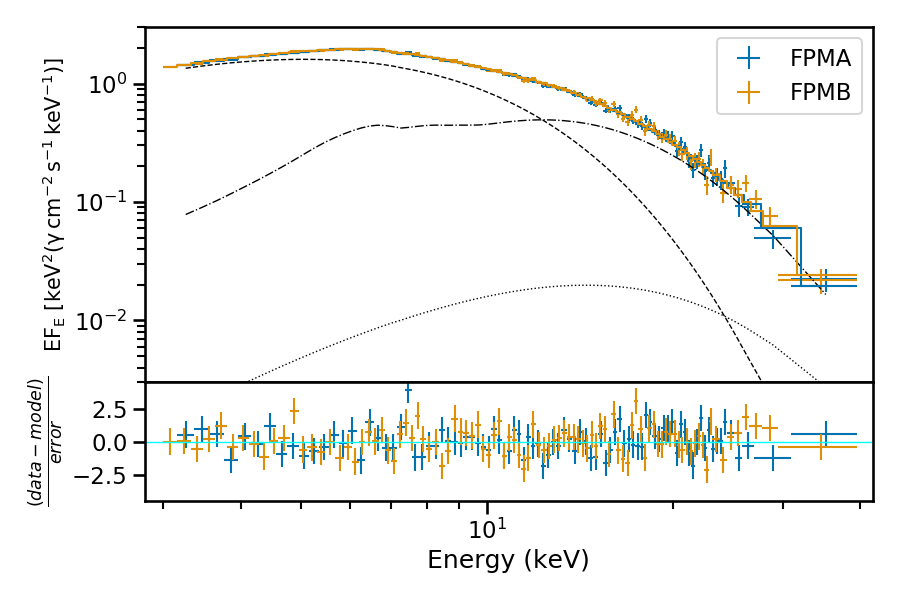

/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  # This is added back by InteractiveShellApp.init_path()
/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  from ipykernel import kernelapp as app
/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through

<IPython.core.display.Javascript object>


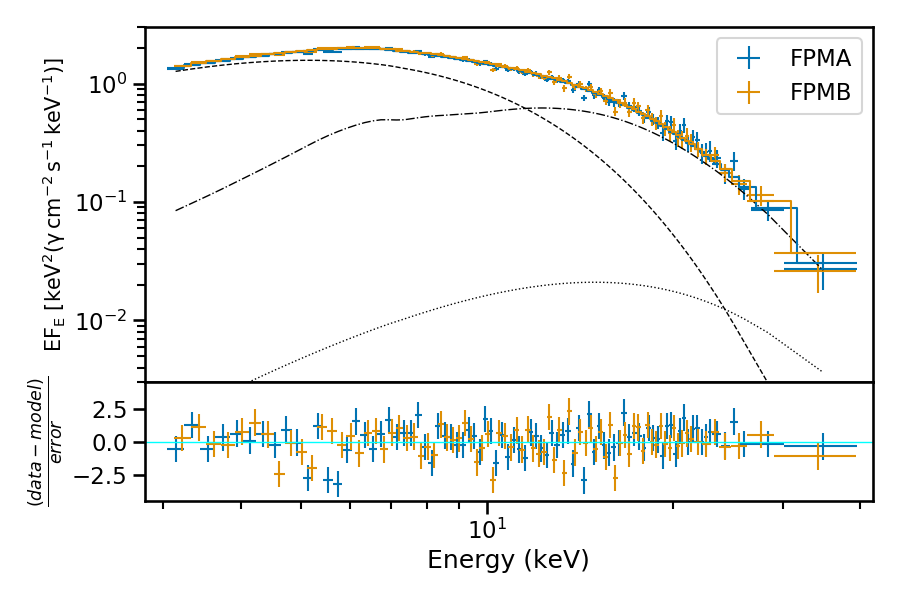

/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  # This is added back by InteractiveShellApp.init_path()
/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  from ipykernel import kernelapp as app
/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through

<IPython.core.display.Javascript object>


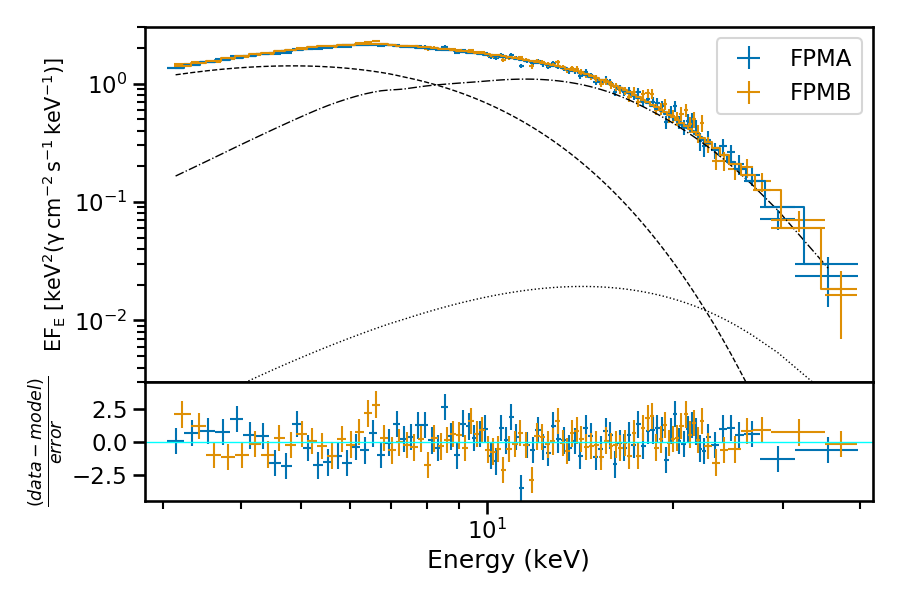

/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  # This is added back by InteractiveShellApp.init_path()
/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  from ipykernel import kernelapp as app


In [74]:
sns.set_palette('colorblind')
lw = 1.5
# ls = 'steps'
ls=''
for i in range(len(data_eeufspec)):
    if not i%2:
        fig, (ax1, ax2) = plt.subplots(2,1, sharex=True,  gridspec_kw = {'height_ratios':[3, 1], 'hspace':0}, figsize=(9, 6))
        ax1.errorbar(data_eeufspec[i][0],data_eeufspec[i][2], xerr=data_eeufspec[i][1], yerr=data_eeufspec[i][3], \
                     ls=ls, lw=lw, color='C0', label = 'FPMA')
        ax1.errorbar(data_eeufspec[i][0],data_eeufspec[i][4], xerr=data_eeufspec[i][1], \
                     ls='steps-mid', color='C0', lw=lw)
        ax1.errorbar(data_eeufspec[i+1][0],data_eeufspec[i+1][2], xerr=data_eeufspec[i+1][1], yerr=data_eeufspec[i+1][3], \
                     ls=ls, lw=lw, color='C1', label = 'FPMB')
        ax1.errorbar(data_eeufspec[i+1][0],data_eeufspec[i+1][4], xerr=data_eeufspec[i+1][1], \
                     ls='steps-mid', color='C1', lw=lw)
        
        ax1.plot(data_eeufspec[i][0],data_eeufspec[i][5], color='black', lw=1.0, ls = '--')
        ax1.plot(data_eeufspec[i][0],data_eeufspec[i][6], color='black', lw=1.0, ls = ':')
        ax1.plot(data_eeufspec[i][0],data_eeufspec[i][7], color='black', lw=1.0, ls = '-.')

        ax2.errorbar(data_eeufspec[i][0],(data_eeufspec[i][2]-data_eeufspec[i][4])/data_eeufspec[i][3], xerr=data_eeufspec[i][1], yerr=1.0, \
                     ls=ls, color='C0', lw=lw)
        ax2.errorbar(data_eeufspec[i+1][0],(data_eeufspec[i+1][2] - data_eeufspec[i+1][4])/data_eeufspec[i+1][3], xerr=data_eeufspec[i+1][1],yerr=1.0, \
                     ls=ls, color='C1', lw=lw)
        
        ax1.legend()
        ax1.loglog()
        plt.xlabel('Energy (keV)')
        ax1.set_ylabel(r'$\mathrm{EF_E\ [keV^{2}(\gamma\,cm^{-2}\,s^{-1}\,keV^{-1})]}$', fontsize=15)
        ax2.set_ylabel(r'$\frac{(data-model)}{error}$')
        ax1.set_ylim((3e-3, 3.0))
        ax2.set_ylim((-4.5,4.5))
        ax2.set_xlim((2.8,42.0))
        ax1.set_xlim((2.8,42.0))
        ax2.axhline(0,color='cyan', lw=1.0)
        plt.tight_layout()
        plt.savefig(plot_dir + 'eeufspec_resid_' + name_list[int(i/2)] + '.pdf')
#         plt.close()



<IPython.core.display.Javascript object>


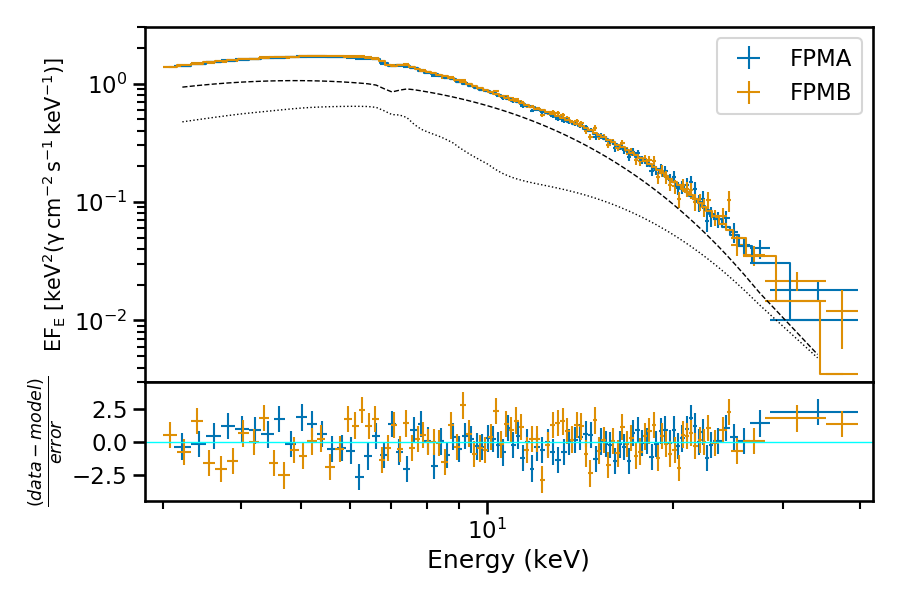

/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  # This is added back by InteractiveShellApp.init_path()
/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  from ipykernel import kernelapp as app


<IPython.core.display.Javascript object>


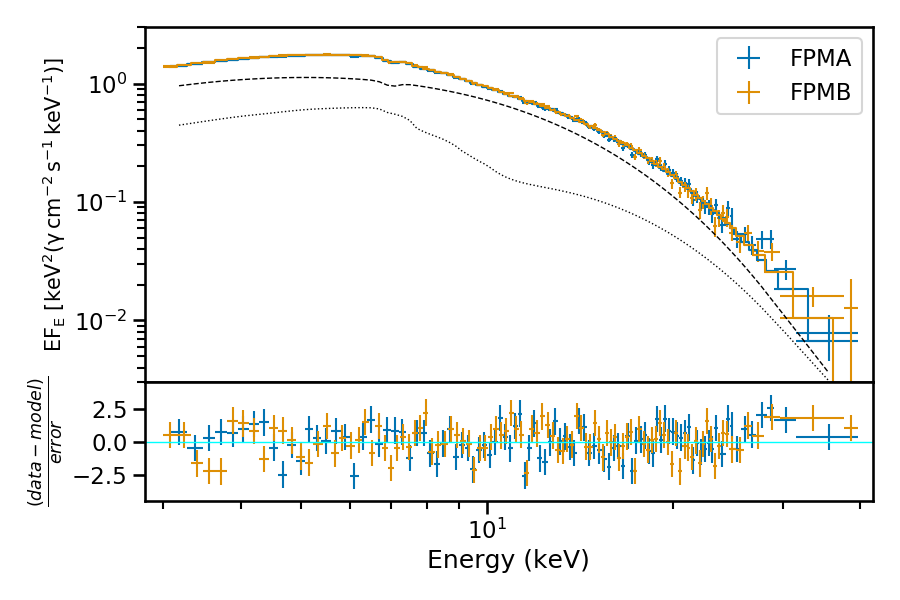

/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  # This is added back by InteractiveShellApp.init_path()
/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  from ipykernel import kernelapp as app


<IPython.core.display.Javascript object>


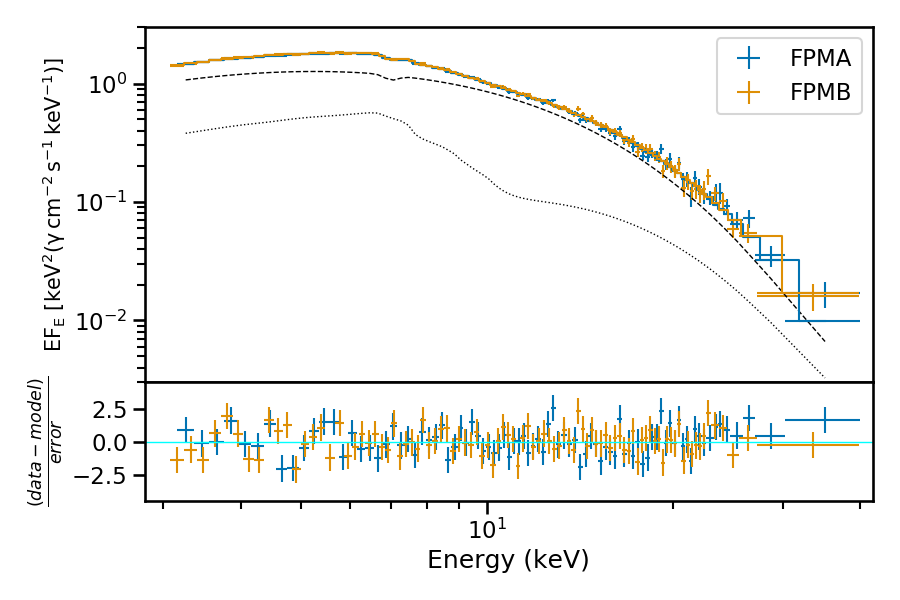

/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  # This is added back by InteractiveShellApp.init_path()
/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  from ipykernel import kernelapp as app


<IPython.core.display.Javascript object>


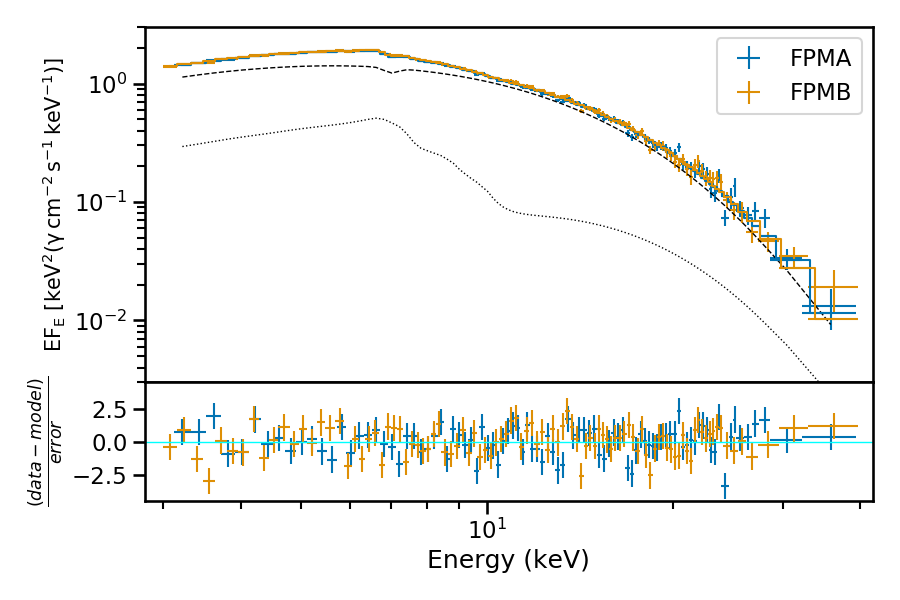

/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  # This is added back by InteractiveShellApp.init_path()
/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  from ipykernel import kernelapp as app


<IPython.core.display.Javascript object>


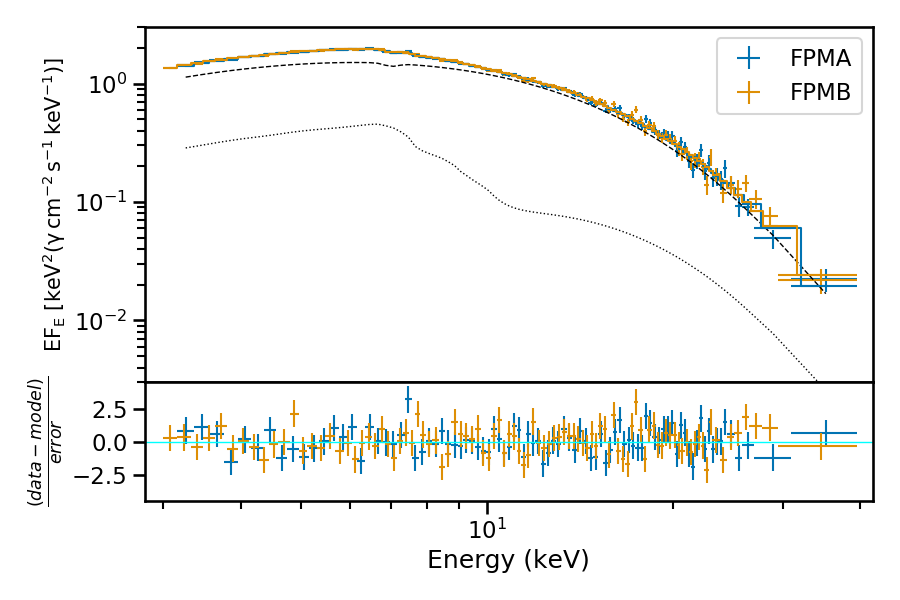

/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  # This is added back by InteractiveShellApp.init_path()
/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  from ipykernel import kernelapp as app


<IPython.core.display.Javascript object>


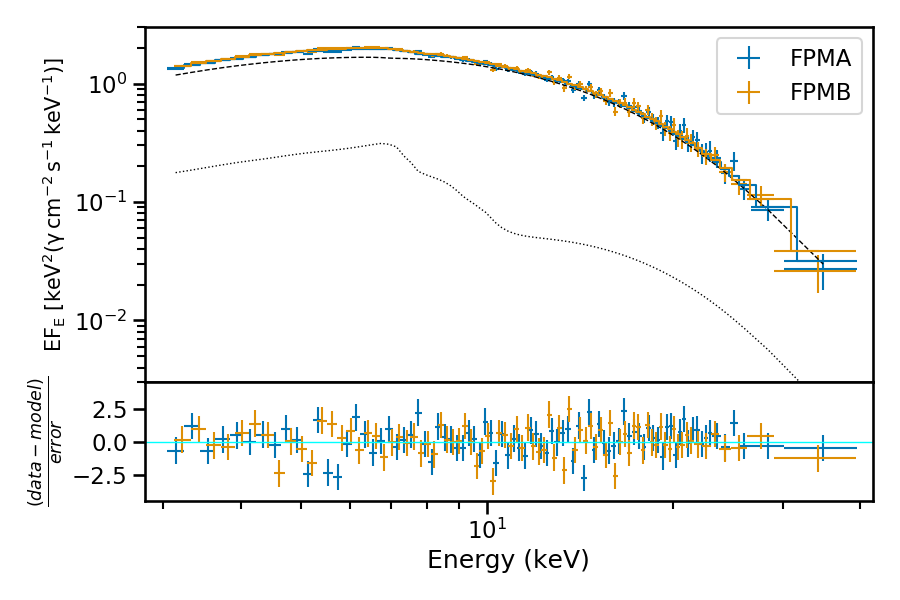

/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  # This is added back by InteractiveShellApp.init_path()
/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  from ipykernel import kernelapp as app


<IPython.core.display.Javascript object>


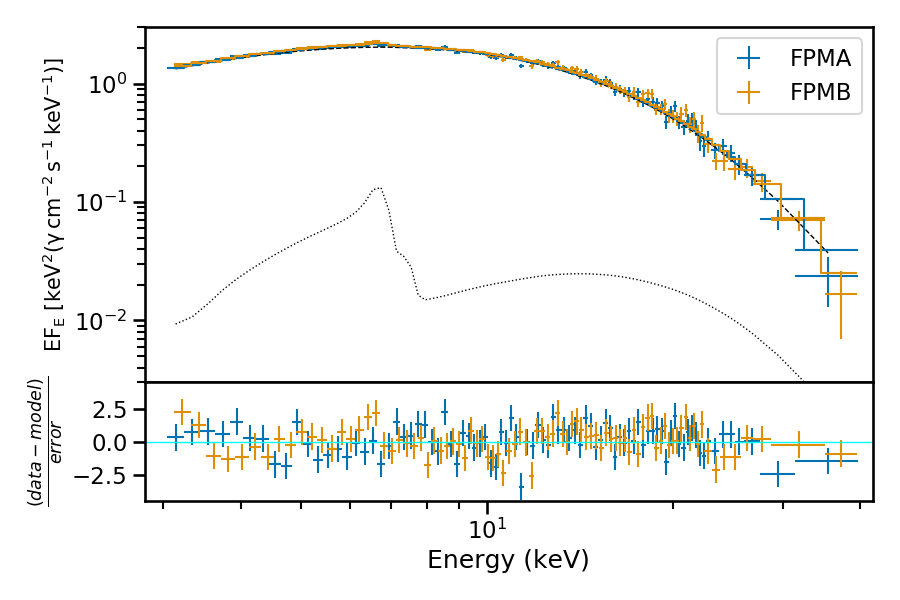

/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  # This is added back by InteractiveShellApp.init_path()
/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing the drawstyle with the linestyle as a single string is deprecated since Matplotlib 3.1 and support will be removed in 3.3; please pass the drawstyle separately using the drawstyle keyword argument to Line2D or set_drawstyle() method (or ds/set_ds()).
  from ipykernel import kernelapp as app


In [20]:
sns.set_palette('colorblind')
lw = 1.5
# ls = 'steps'
ls=''
for i in range(len(data_eeufspec_cutoffpl)):
    if not i%2:
        fig, (ax1, ax2) = plt.subplots(2,1, sharex=True,  gridspec_kw = {'height_ratios':[3, 1], 'hspace':0}, figsize=(9, 6))
        ax1.errorbar(data_eeufspec_cutoffpl[i][0],data_eeufspec_cutoffpl[i][2], xerr=data_eeufspec_cutoffpl[i][1], yerr=data_eeufspec_cutoffpl[i][3], \
                     ls=ls, lw=lw, color='C0', label = 'FPMA')
        ax1.errorbar(data_eeufspec_cutoffpl[i][0],data_eeufspec_cutoffpl[i][4], xerr=data_eeufspec_cutoffpl[i][1], \
                     ls='steps-mid', color='C0', lw=lw)
        ax1.errorbar(data_eeufspec_cutoffpl[i+1][0],data_eeufspec_cutoffpl[i+1][2], xerr=data_eeufspec_cutoffpl[i+1][1], yerr=data_eeufspec_cutoffpl[i+1][3], \
                     ls=ls, lw=lw, color='C1', label = 'FPMB')
        ax1.errorbar(data_eeufspec_cutoffpl[i+1][0],data_eeufspec_cutoffpl[i+1][4], xerr=data_eeufspec_cutoffpl[i+1][1], \
                     ls='steps-mid', color='C1', lw=lw)
        
        ax1.plot(data_eeufspec_cutoffpl[i][0],data_eeufspec_cutoffpl[i][5], color='black', lw=1.0, ls = '--')
        ax1.plot(data_eeufspec_cutoffpl[i][0],data_eeufspec_cutoffpl[i][6], color='black', lw=1.0, ls = ':')

        ax2.errorbar(data_eeufspec_cutoffpl[i][0],(data_eeufspec_cutoffpl[i][2]-data_eeufspec_cutoffpl[i][4])/data_eeufspec_cutoffpl[i][3], xerr=data_eeufspec_cutoffpl[i][1], yerr=1.0, \
                     ls=ls, color='C0', lw=lw)
        ax2.errorbar(data_eeufspec_cutoffpl[i+1][0],(data_eeufspec_cutoffpl[i+1][2] - data_eeufspec_cutoffpl[i+1][4])/data_eeufspec_cutoffpl[i+1][3], xerr=data_eeufspec_cutoffpl[i+1][1],yerr=1.0, \
                     ls=ls, color='C1', lw=lw)
        
        ax1.legend()
        ax1.loglog()
        plt.xlabel('Energy (keV)')
        ax1.set_ylabel(r'$\mathrm{EF_E\ [keV^{2}(\gamma\,cm^{-2}\,s^{-1}\,keV^{-1})]}$', fontsize=15)
        ax2.set_ylabel(r'$\frac{(data-model)}{error}$')
        ax1.set_ylim((3e-3, 3.0))
        ax2.set_ylim((-4.5,4.5))
        ax2.set_xlim((2.8,42.0))
        ax1.set_xlim((2.8,42.0))
        ax2.axhline(0,color='cyan', lw=1.0)
        plt.tight_layout()
        plt.savefig(plot_dir + 'eeufspec_cutoffpl_resid_' + name_list[int(i/2)] + '.pdf')
#         plt.close()



<IPython.core.display.Javascript object>


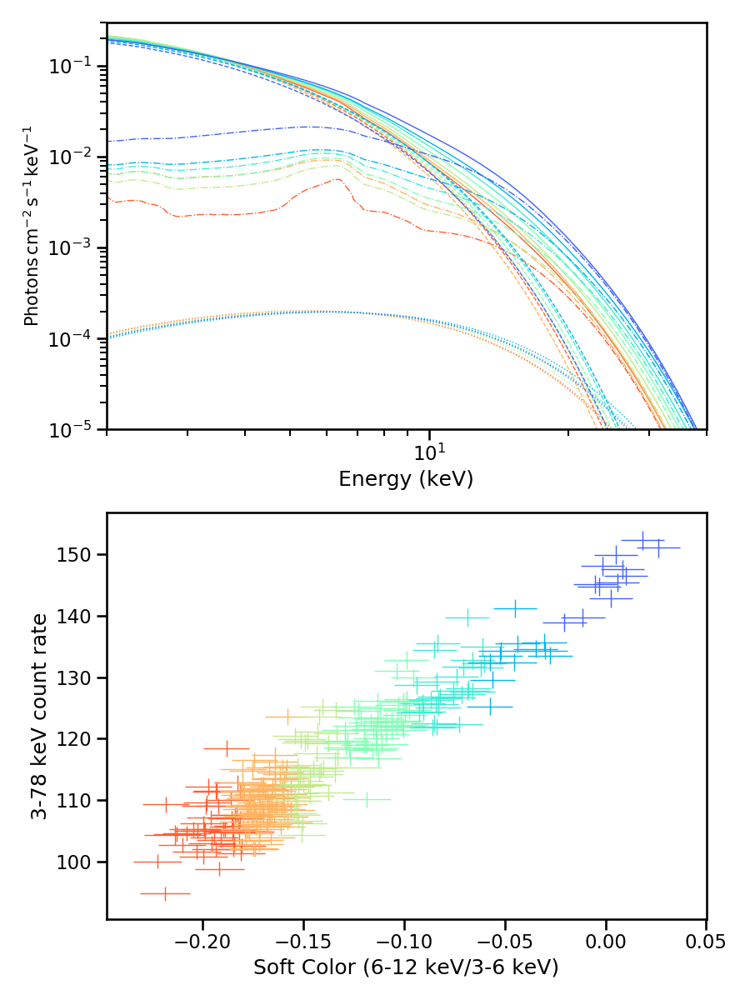

In [18]:
palette = reversed(sns.color_palette('rainbow', 7))
sns.set_palette(palette, 7)
lw = 1.5
# ls = 'steps'

# fig, (ax1, ax2) = plt.subplots(1,2,  gridspec_kw = {'width_ratios':[1, 1], 'hspace':0}, figsize=(10, 5))
fig, (ax1, ax2) = plt.subplots(2,1,  gridspec_kw = {'height_ratios':[1, 1]}, figsize=(9, 12))
plt.ticklabel_format(style='plain')
for i in range(len(data_model)):
    if not i%2:
        ax1.plot(data_model[i][0], data_model[i][2], color='C' + str(int(i/2)), lw = 1.0)
        ax1.plot(data_model[i][0], data_model[i][3], ls='--', color='C' + str(int(i/2)), lw = 1.0)
        ax1.plot(data_model[i][0], data_model[i][4], ls=':', color='C' + str(int(i/2)), lw = 1.0)
        ax1.plot(data_model[i][0], data_model[i][5], ls='-.', color='C' + str(int(i/2)), lw = 1.0)

#         ax2.errorbar(data_eeufspec[i][0],(data_eeufspec[i][2]-data_eeufspec[i][4])/data_eeufspec[i][3], xerr=data_eeufspec[i][1], yerr=1.0, \
#                      ls=ls, color='C0', lw=lw)
#         ax2.errorbar(data_eeufspec[i+1][0],(data_eeufspec[i+1][2] - data_eeufspec[i+1][4])/data_eeufspec[i+1][3], xerr=data_eeufspec[i+1][1],yerr=1.0, \
#                      ls=ls, color='C1', lw=lw)
#         ax1.legend()
ax1.set_xlim((2.0,40.0))
ax1.set_ylim((1e-5,0.3))
ax1.loglog()
ax1.set_xlabel('Energy (keV)')
ax1.set_ylabel(r'$\mathrm{Photons\,cm^{-2}\,s^{-1}\,keV^{-1}}$', fontsize=15)


for k, b in enumerate(soft_bins):
    soft_mask = (soft_color < b[1]) * (soft_color >= b[0])
    ax2.errorbar(soft_color[soft_mask], total_curve.countrate[soft_mask], xerr = soft_err[soft_mask], yerr=total_curve.countrate_err[soft_mask], fmt='none', color = 'C' + str(k), lw = 1.0)
ax2.set_xlabel('Soft Color (6-12 keV/3-6 keV)')
ax2.set_ylabel('3-78 keV count rate')
plt.tight_layout()
plt.savefig(plot_dir + 'model_all_states.pdf')
#         plt.close()



/disk/lif2/spike/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


<IPython.core.display.Javascript object>


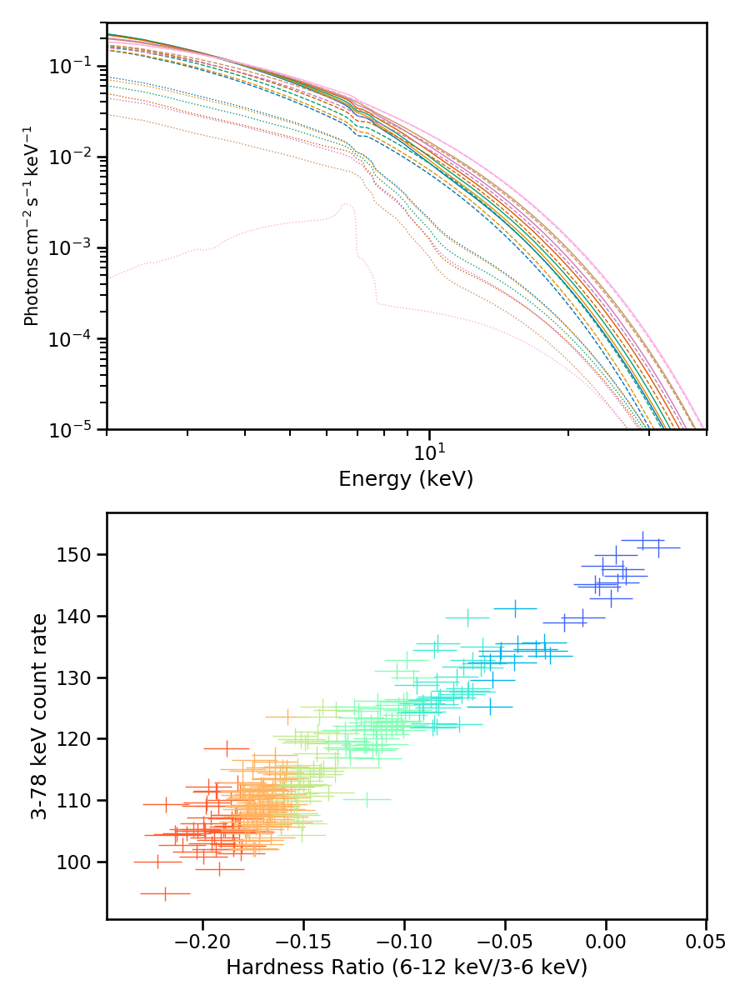

In [21]:
palette = reversed(sns.color_palette('rainbow', 7))
sns.set_palette(palette, 7)
lw = 1.5
# ls = 'steps'

# fig, (ax1, ax2) = plt.subplots(1,2,  gridspec_kw = {'width_ratios':[1, 1], 'hspace':0}, figsize=(10, 5))
fig, (ax1, ax2) = plt.subplots(2,1,  gridspec_kw = {'height_ratios':[1, 1]}, figsize=(9, 12))

for i in range(len(data_model_cutoffpl)):
    if not i%2:
        ax1.plot(data_model_cutoffpl[i][0], data_model_cutoffpl[i][2], color='C' + str(int(i/2)), lw = 1.0)
        ax1.plot(data_model_cutoffpl[i][0], data_model_cutoffpl[i][3], ls='--', color='C' + str(int(i/2)), lw = 1.0)
        ax1.plot(data_model_cutoffpl[i][0], data_model_cutoffpl[i][4], ls=':', color='C' + str(int(i/2)), lw = 1.0)


ax1.set_xlim((2.0,40.0))
ax1.set_ylim((1e-5,0.3))
ax1.loglog()
ax1.set_xlabel('Energy (keV)')
ax1.set_ylabel(r'$\mathrm{Photons\,cm^{-2}\,s^{-1}\,keV^{-1}}$', fontsize=15)

for k, b in enumerate(soft_bins):
    soft_mask = (soft_color < b[1]) * (soft_color >= b[0])
    ax2.errorbar(soft_color[soft_mask], total_curve.countrate[soft_mask], xerr = soft_err[soft_mask], yerr=total_curve.countrate_err[soft_mask], fmt='none', color = 'C' + str(k), lw = 1.0)
ax2.set_xlabel('Hardness Ratio (6-12 keV/3-6 keV)')
ax2.set_ylabel('3-78 keV count rate')
plt.tight_layout()
plt.savefig(plot_dir + 'model_cutoffpl_all_states.pdf')
#         plt.close()



<IPython.core.display.Javascript object>


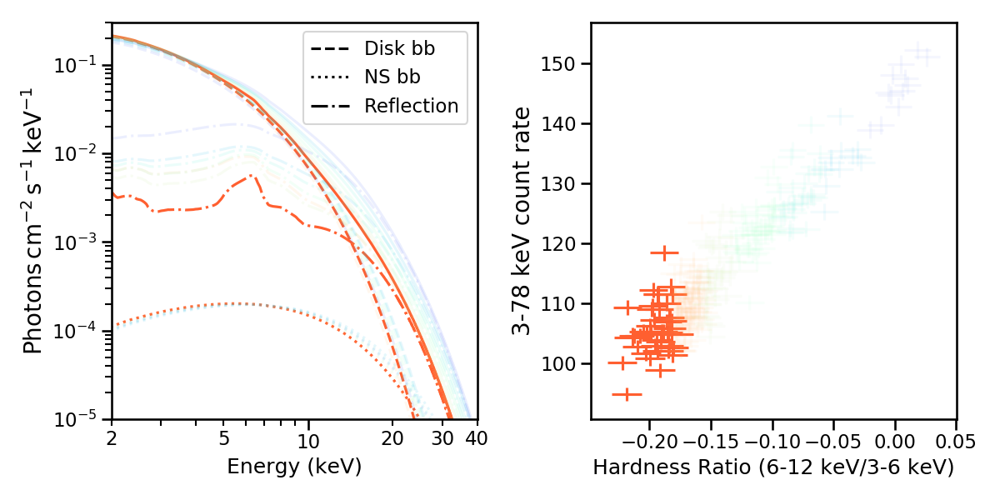

<IPython.core.display.Javascript object>


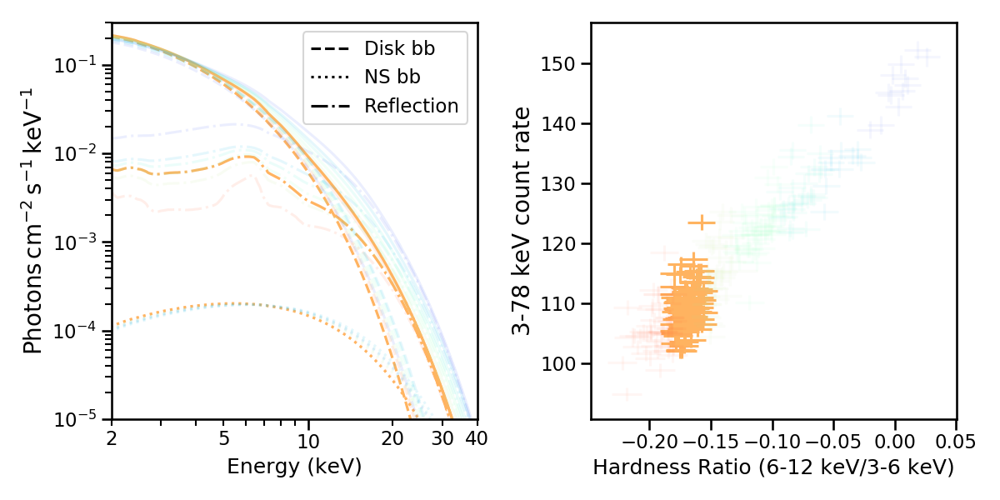

<IPython.core.display.Javascript object>


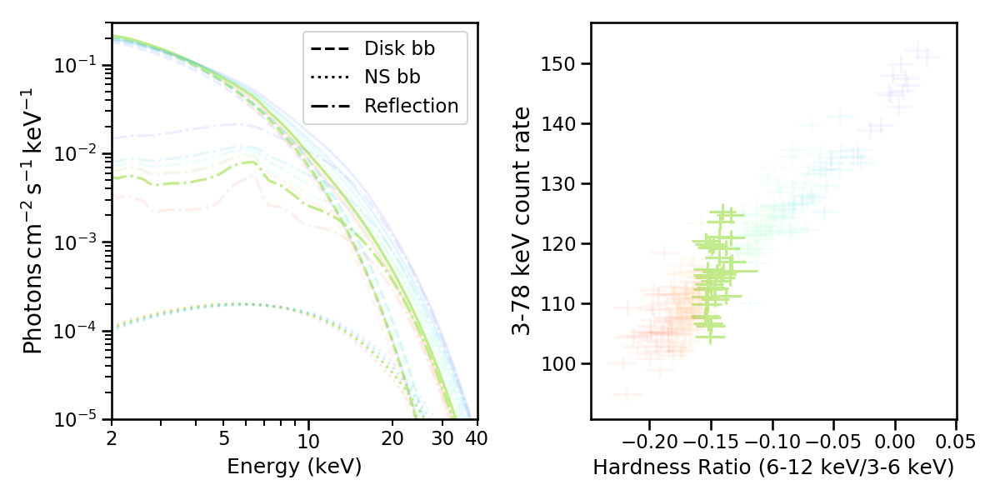

<IPython.core.display.Javascript object>


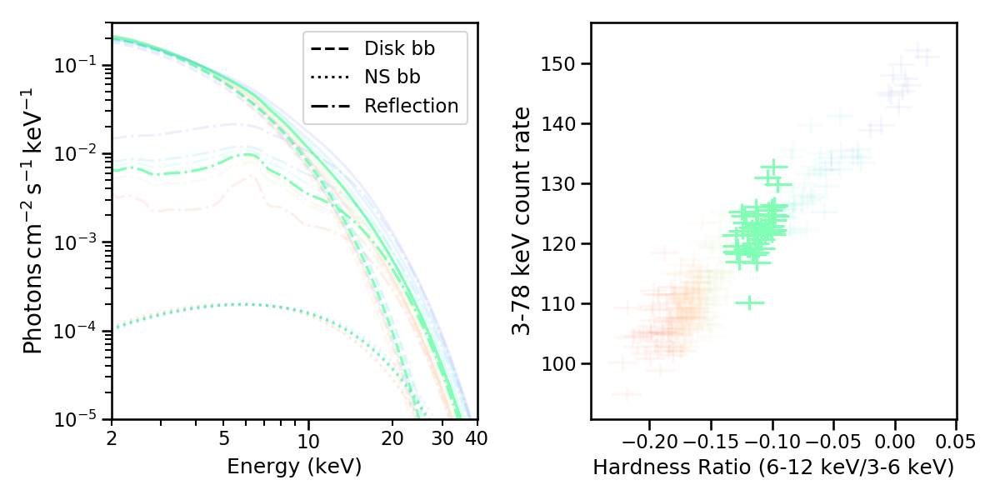

<IPython.core.display.Javascript object>


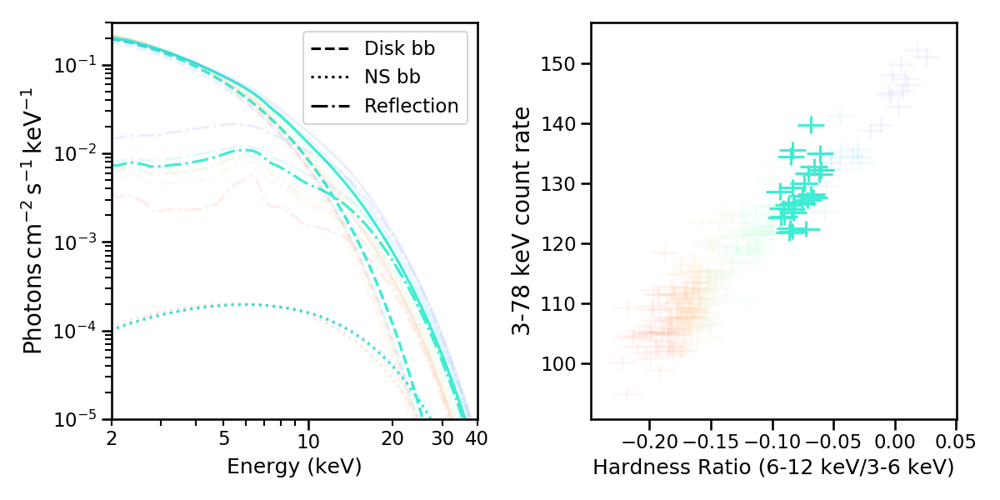

<IPython.core.display.Javascript object>


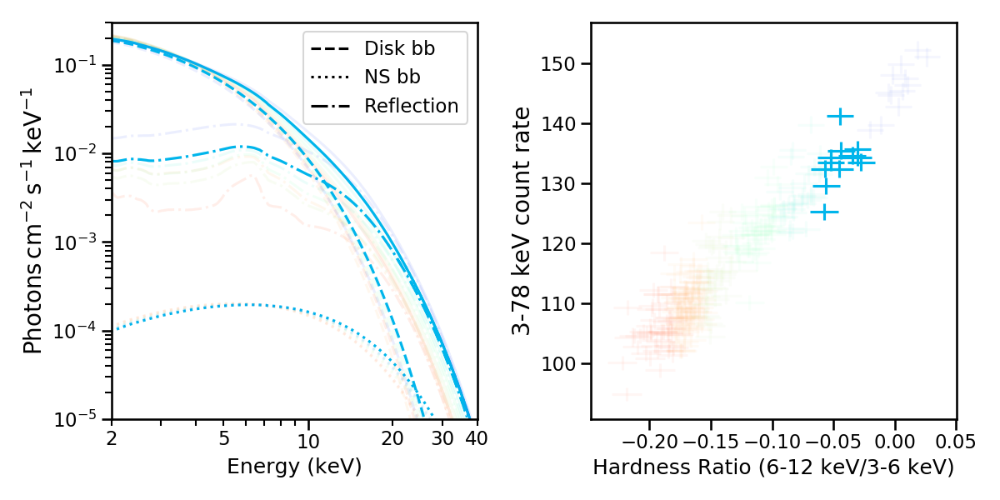

<IPython.core.display.Javascript object>


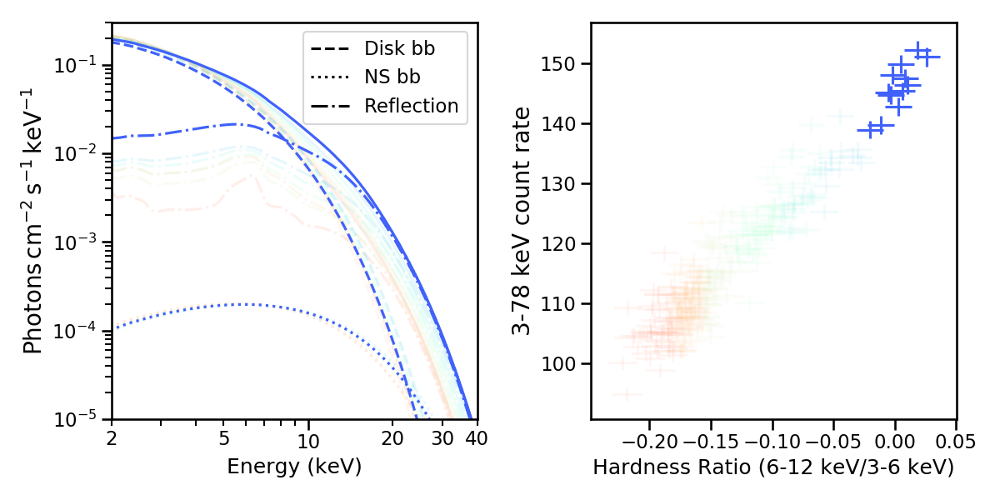

In [101]:
palette = reversed(sns.color_palette('rainbow', 7))
sns.set_palette(palette, 7)
lw = 1.5
# ims = []
for k, b in enumerate(soft_bins):
    soft_mask = (soft_color < b[1]) * (soft_color >= b[0])
    
    fig, (ax1, ax2) = plt.subplots(1,2,  gridspec_kw = {'width_ratios':[1, 1], 'hspace':0}, figsize=(12, 6))

    for i in range(len(data_model)):
        if not i%2:
            ax1.plot(data_model[i][0], data_model[i][2], color='C' + str(int(i/2)), alpha=0.1)
            ax1.plot(data_model[i][0], data_model[i][3], ls='--', color='C' + str(int(i/2)), alpha=0.1)
            ax1.plot(data_model[i][0], data_model[i][4], ls=':', color='C' + str(int(i/2)), alpha=0.1)
            ax1.plot(data_model[i][0], data_model[i][5], ls='-.', color='C' + str(int(i/2)), alpha=0.1)
            if k==int(i/2):
                ax1.plot(data_model[i][0], data_model[i][2], color='C' + str(k))
                ax1.plot(data_model[i][0], data_model[i][3], ls='--', color='C' + str(k))
                ax1.plot(data_model[i][0], data_model[i][4], ls=':', color='C' + str(k))
                ax1.plot(data_model[i][0], data_model[i][5], ls='-.', color='C' + str(k))
    

    #         ax2.errorbar(data_eeufspec[i][0],(data_eeufspec[i][2]-data_eeufspec[i][4])/data_eeufspec[i][3], xerr=data_eeufspec[i][1], yerr=1.0, \
    #                      ls=ls, color='C0', lw=lw)
    #         ax2.errorbar(data_eeufspec[i+1][0],(data_eeufspec[i+1][2] - data_eeufspec[i+1][4])/data_eeufspec[i+1][3], xerr=data_eeufspec[i+1][1],yerr=1.0, \
    #                      ls=ls, color='C1', lw=lw)
    #         ax1.legend()
    ax1.plot([0,1], [0,1], ls='--', color='black', label='Disk bb')
    ax1.plot([0,1], [0,1], ls=':', color='black', label='NS bb')
    ax1.plot([0,1], [0,1], ls='-.', color='black', label='Reflection')
    ax1.legend(loc = 1)
    ax1.set_xlim((2.0,40.0))
    ax1.set_ylim((1e-5,0.3))
    ax1.loglog()
    ax1.set_xlabel('Energy (keV)')
    ax1.set_ylabel(r'$\mathrm{Photons\,cm^{-2}\,s^{-1}\,keV^{-1}}$', fontsize=20)
    ax1.xaxis.set_major_formatter(ScalarFormatter())
    ax1.set_xticks([2,3,4,5,6,7,8,9,20,30,40], minor = True)
    ax1.set_xticklabels(['2','','','5','','','','','20','30','40'], minor=True)
    ax1.set_xticks([10], minor = False)
    ax1.set_xticklabels(['10'], minor=False)
    
    ax2.errorbar(soft_color[soft_mask], total_curve.countrate[soft_mask], xerr = soft_err[soft_mask], yerr=total_curve.countrate_err[soft_mask], fmt='none', color = 'C' + str(k))
    
    for l, c in enumerate(soft_bins):
        if k != l:
            temp_mask = (soft_color < c[1]) * (soft_color >= c[0])
            ax2.errorbar(soft_color[temp_mask], total_curve.countrate[temp_mask], xerr = soft_err[temp_mask], yerr=total_curve.countrate_err[temp_mask], fmt='none', color = 'C' + str(l), alpha=0.05)


    ax2.set_xlabel('Hardness Ratio (6-12 keV/3-6 keV)')
    ax2.set_ylabel('3-78 keV count rate', fontsize=20)
    plt.tight_layout()
    plt.savefig(plot_dir + 'model_' + name_list[k] + '_rainbow.png')
    #         plt.close()

# fig, (ax1, ax2) = plt.subplots(1,2,  gridspec_kw = {'width_ratios':[1, 1], 'hspace':0}, figsize=(10, 5))

# for i in range(len(data_model)):
#     if not i%2:
#         ax1.plot(data_model[i][0], data_model[i][2], color='C0')
#         ax1.plot(data_model[i][0], data_model[i][3], ls='--', color='C0')
#         ax1.plot(data_model[i][0], data_model[i][4], ls=':', color='C0')
#         ax1.plot(data_model[i][0], data_model[i][5], ls='-.', color='C0')

# ax1.set_xlim((2.0,40.0))
# ax1.set_ylim((1e-5,0.3))
# ax1.loglog()
# ax1.set_xlabel('Energy (keV)')
# ax1.set_ylabel(r'$\mathrm{Photons\,cm^{-2}\,s^{-1}\,keV^{-1}}$', fontsize=15)

# ax2.errorbar(soft_color, total_curve.countrate, xerr = soft_err, yerr=total_curve.countrate_err, fmt='none', color = 'C0')


# ax2.set_xlabel('Hardness Ratio (6-12 keV/3-6 keV)')
# ax2.set_ylabel('3-78 keV count rate')
# plt.tight_layout()
# # plt.savefig(plot_dir + 'model_all_softcolor_talk.pdf')



<IPython.core.display.Javascript object>


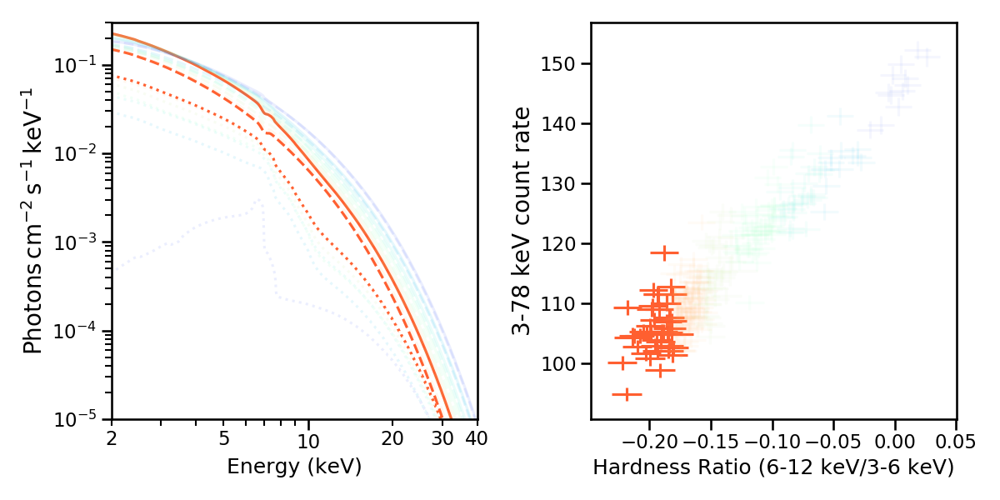

<IPython.core.display.Javascript object>


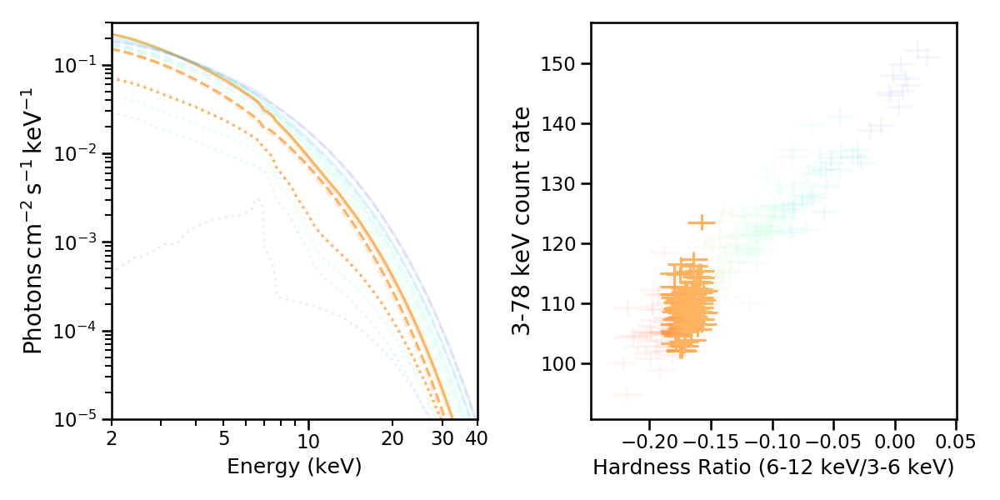

<IPython.core.display.Javascript object>


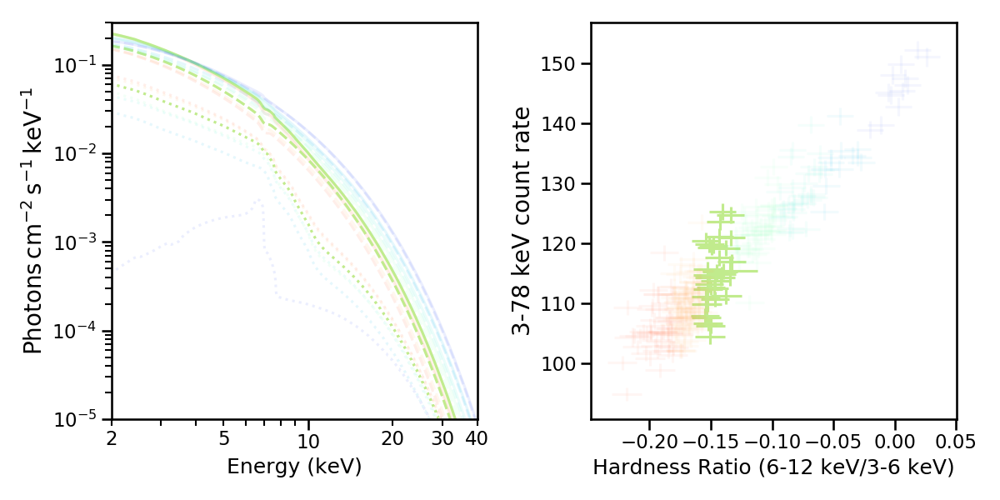

<IPython.core.display.Javascript object>


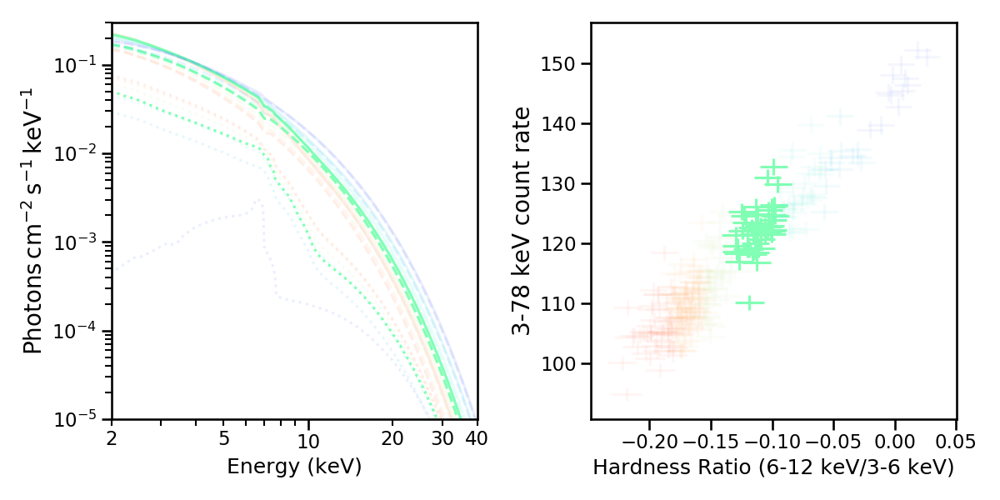

<IPython.core.display.Javascript object>


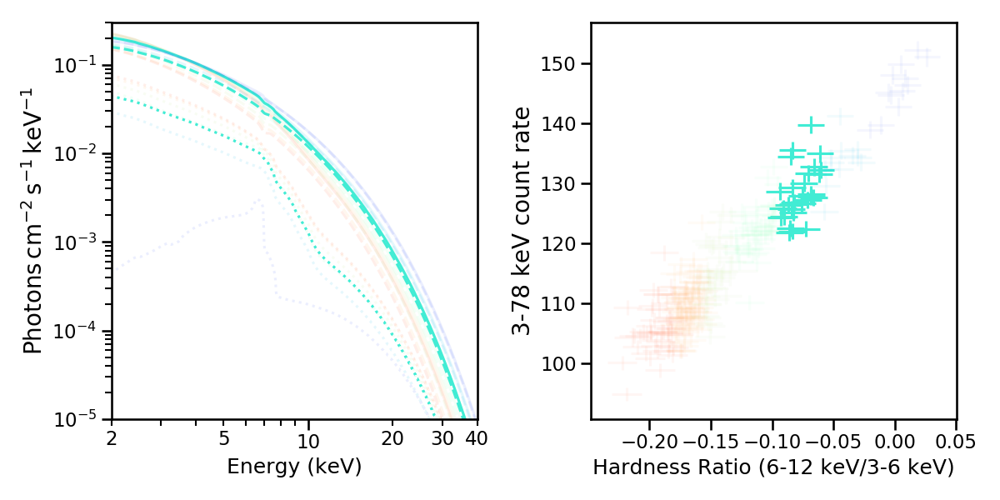

<IPython.core.display.Javascript object>


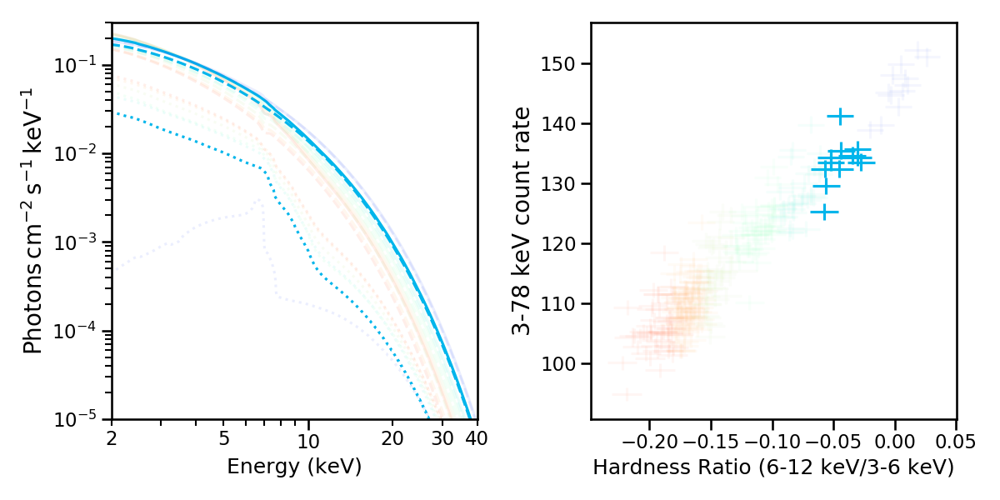

<IPython.core.display.Javascript object>


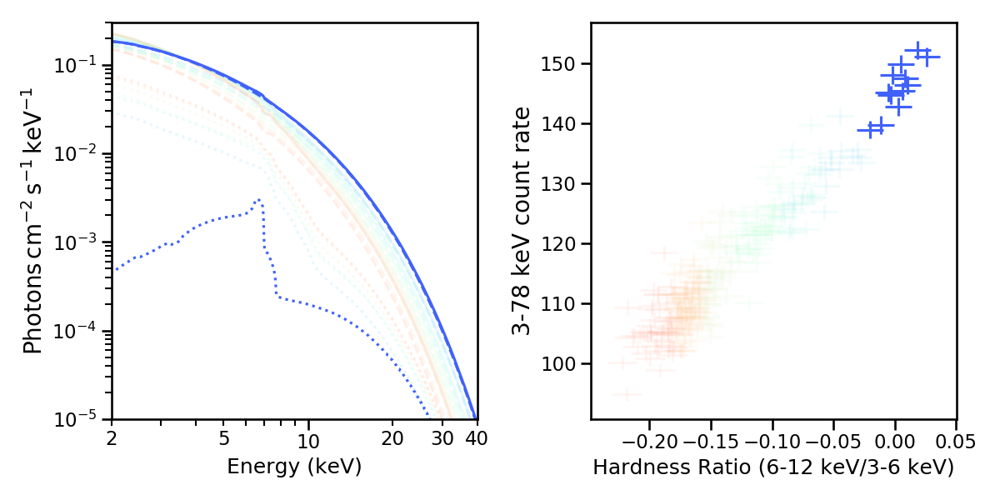

In [58]:
palette = reversed(sns.color_palette('rainbow', 7))
sns.set_palette(palette, 7)
lw = 1.5
# ims = []
for k, b in enumerate(soft_bins):
    soft_mask = (soft_color < b[1]) * (soft_color >= b[0])
    
    fig, (ax1, ax2) = plt.subplots(1,2,  gridspec_kw = {'width_ratios':[1, 1], 'hspace':0}, figsize=(12, 6))

    for i in range(len(data_model)):
        if not i%2:
            ax1.plot(data_model_cutoffpl[i][0], data_model_cutoffpl[i][2], color='C' + str(int(i/2)), alpha=0.1)
            ax1.plot(data_model_cutoffpl[i][0], data_model_cutoffpl[i][3], ls='--', color='C' + str(int(i/2)), alpha=0.1)
            ax1.plot(data_model_cutoffpl[i][0], data_model_cutoffpl[i][4], ls=':', color='C' + str(int(i/2)), alpha=0.1)
            if k==int(i/2):
                ax1.plot(data_model_cutoffpl[i][0], data_model_cutoffpl[i][2], color='C' + str(k))
                ax1.plot(data_model_cutoffpl[i][0], data_model_cutoffpl[i][3], ls='--', color='C' + str(k))
                ax1.plot(data_model_cutoffpl[i][0], data_model_cutoffpl[i][4], ls=':', color='C' + str(k))


    #         ax2.errorbar(data_eeufspec[i][0],(data_eeufspec[i][2]-data_eeufspec[i][4])/data_eeufspec[i][3], xerr=data_eeufspec[i][1], yerr=1.0, \
    #                      ls=ls, color='C0', lw=lw)
    #         ax2.errorbar(data_eeufspec[i+1][0],(data_eeufspec[i+1][2] - data_eeufspec[i+1][4])/data_eeufspec[i+1][3], xerr=data_eeufspec[i+1][1],yerr=1.0, \
    #                      ls=ls, color='C1', lw=lw)
    #         ax1.legend()
    ax1.set_xlim((2.0,40.0))
    ax1.set_ylim((1e-5,0.3))
    ax1.loglog()
    ax1.set_xlabel('Energy (keV)')
    ax1.set_ylabel(r'$\mathrm{Photons\,cm^{-2}\,s^{-1}\,keV^{-1}}$', fontsize=20)
    ax1.xaxis.set_major_formatter(ScalarFormatter())
    ax1.set_xticks([2,3,4,5,6,7,8,9,20,30,40], minor = True)
    ax1.set_xticklabels(['2','','','5','','','','','20','30','40'], minor=True)
    ax1.set_xticks([10], minor = False)
    ax1.set_xticklabels(['10'], minor=False)
    
    ax2.errorbar(soft_color[soft_mask], total_curve.countrate[soft_mask], xerr = soft_err[soft_mask], yerr=total_curve.countrate_err[soft_mask], fmt='none', color = 'C' + str(k))
    
    for l, c in enumerate(soft_bins):
        if k != l:
            temp_mask = (soft_color < c[1]) * (soft_color >= c[0])
            ax2.errorbar(soft_color[temp_mask], total_curve.countrate[temp_mask], xerr = soft_err[temp_mask], yerr=total_curve.countrate_err[temp_mask], fmt='none', color = 'C' + str(l), alpha=0.05)


    ax2.set_xlabel('Hardness Ratio (6-12 keV/3-6 keV)')
    ax2.set_ylabel('3-78 keV count rate', fontsize=20)
    plt.tight_layout()
    plt.savefig(plot_dir + 'model_cutoffpl_' + name_list[k] + '_rainbow.pdf')



# fig, (ax1, ax2) = plt.subplots(1,2,  gridspec_kw = {'width_ratios':[1, 1], 'hspace':0}, figsize=(10, 5))

# for i in range(len(data_model_cutoffpl)):
#     if not i%2:
#         ax1.plot(data_model_cutoffpl[i][0], data_model_cutoffpl[i][2], color='C0')
#         ax1.plot(data_model_cutoffpl[i][0], data_model_cutoffpl[i][3], ls='--', color='C0')
#         ax1.plot(data_model_cutoffpl[i][0], data_model_cutoffpl[i][4], ls=':', color='C0')

# ax1.set_xlim((2.0,40.0))
# ax1.set_ylim((1e-5,0.3))
# ax1.loglog()
# ax1.set_xlabel('Energy (keV)')
# ax1.set_ylabel(r'$\mathrm{Photons\,cm^{-2}\,s^{-1}\,keV^{-1}}$', fontsize=15)

# ax2.errorbar(soft_color, total_curve.countrate, xerr = soft_err, yerr=total_curve.countrate_err, fmt='none', color = 'C0')


# ax2.set_xlabel('Hardness Ratio (6-12 keV/3-6 keV)')
# ax2.set_ylabel('3-78 keV count rate')
# plt.tight_layout()
# plt.savefig(plot_dir + 'model_cutoffpl_all_softcolor_talk.pdf')



<IPython.core.display.Javascript object>


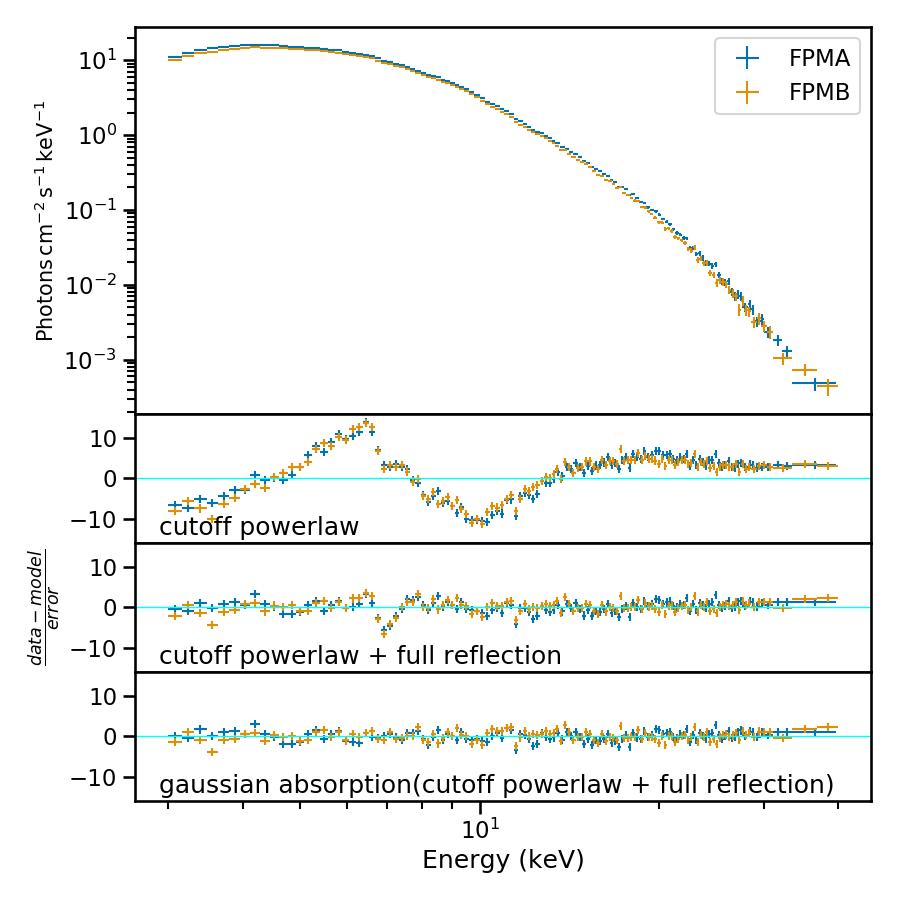

In [62]:
sns.set_palette('colorblind')

fig, (ax1, ax2, ax3, ax4) = plt.subplots(4,1, sharex=True,  gridspec_kw = {'height_ratios':[3, 1,1,1], 'hspace':0}, figsize=(9, 9))
ax1.errorbar(data_ldata[0][0],data_ldata[0][2], xerr=data_ldata[0][1], yerr=data_ldata[0][3], \
             ls=ls, lw=lw, color='C0', label = 'FPMA')
ax1.errorbar(data_ldata[1][0],data_ldata[1][2], xerr=data_ldata[1][1], yerr=data_ldata[1][3], \
             ls=ls, lw=lw, color='C1', label = 'FPMB')

ax2.errorbar(data_cutoffpl_only[0][0],(data_cutoffpl_only[0][2]-data_cutoffpl_only[0][4])/data_cutoffpl_only[0][3], xerr=data_cutoffpl_only[0][1], yerr=1.0, \
             ls=ls, color='C0', lw=lw)
ax2.errorbar(data_cutoffpl_only[1][0],(data_cutoffpl_only[1][2] - data_cutoffpl_only[1][4])/data_cutoffpl_only[1][3], xerr=data_cutoffpl_only[1][1],yerr=1.0, \
             ls=ls, color='C1', lw=lw)

ax3.errorbar(data_cutoffpl_relxill[0][0],(data_cutoffpl_relxill[0][2]-data_cutoffpl_relxill[0][4])/data_cutoffpl_relxill[0][3], xerr=data_cutoffpl_relxill[0][1], yerr=1.0, \
             ls=ls, color='C0', lw=lw)
ax3.errorbar(data_cutoffpl_relxill[1][0],(data_cutoffpl_relxill[1][2] - data_cutoffpl_relxill[1][4])/data_cutoffpl_relxill[1][3], xerr=data_cutoffpl_relxill[1][1],yerr=1.0, \
             ls=ls, color='C1', lw=lw)

ax4.errorbar(data_cutoffpl_relxill_gabs[0][0],(data_cutoffpl_relxill_gabs[0][2]-data_cutoffpl_relxill_gabs[0][4])/data_cutoffpl_relxill_gabs[0][3], xerr=data_cutoffpl_relxill_gabs[0][1], yerr=1.0, \
             ls=ls, color='C0', lw=lw)
ax4.errorbar(data_cutoffpl_relxill_gabs[1][0],(data_cutoffpl_relxill_gabs[1][2] - data_cutoffpl_relxill_gabs[1][4])/data_cutoffpl_relxill_gabs[1][3], xerr=data_cutoffpl_relxill_gabs[1][1],yerr=1.0, \
             ls=ls, color='C1', lw=lw)

ax1.legend()
ax1.loglog()
plt.xlabel('Energy (keV)')
ax1.set_ylabel(r'$\mathrm{Photons\,cm^{-2}\,s^{-1}\,keV^{-1}}$', fontsize=15)
# ax2.set_ylabel(r'$\frac{data}{model}$')
# ax2.axhline(1,color='cyan', lw=1.0)
ax3.set_ylabel(r'$\frac{data-model}{error}$')
ax2.axhline(0,color='cyan', lw=1.0)
ax3.axhline(0,color='cyan', lw=1.0)
ax4.axhline(0,color='cyan', lw=1.0)

ax2.set_ylim(-16,16)
ax3.set_ylim(-16,16)
ax4.set_ylim(-16,16)

ax2.text(2.9, -14, 'cutoff powerlaw')
ax3.text(2.9, -14, 'cutoff powerlaw + full reflection')
ax4.text(2.9, -14, 'gaussian absorption(cutoff powerlaw + full reflection)')


plt.tight_layout()
plt.savefig(plot_dir + 'ldata_threecutoffpl_resid.pdf')



<IPython.core.display.Javascript object>


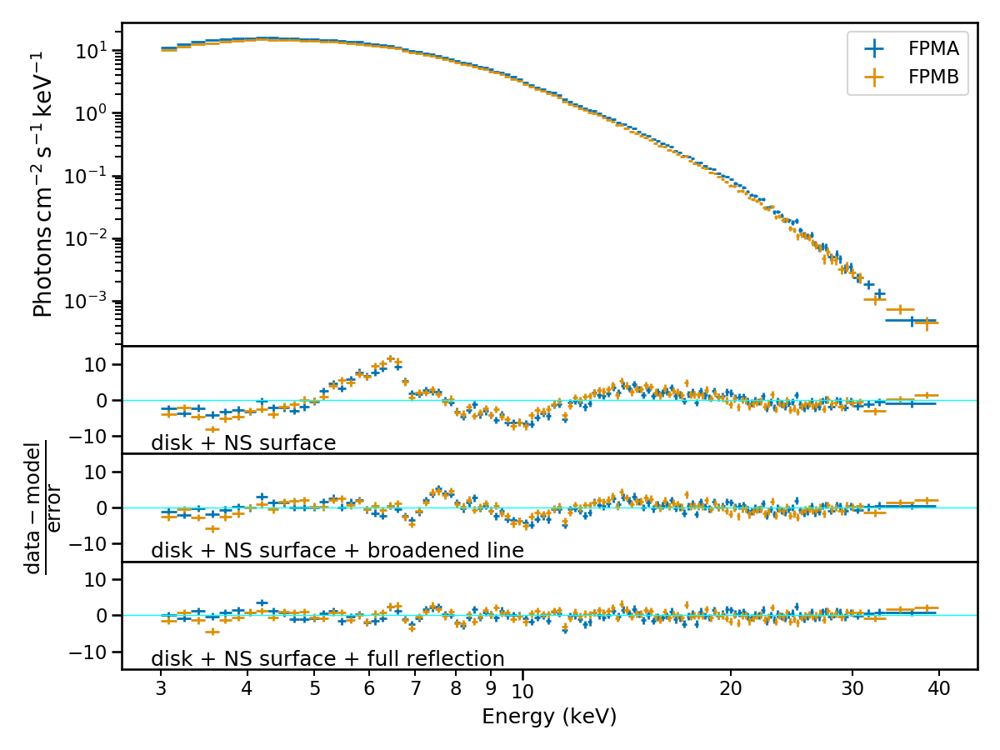

In [94]:
sns.set_palette('colorblind')
lw = 2.0
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4,1, sharex=True,  gridspec_kw = {'height_ratios':[3, 1,1,1], 'hspace':0}, figsize=(12, 9))
ax1.errorbar(data_ldata[0][0],data_ldata[0][2], xerr=data_ldata[0][1], yerr=data_ldata[0][3], \
             ls=ls, lw=lw, color='C0', label = 'FPMA')
ax1.errorbar(data_ldata[1][0],data_ldata[1][2], xerr=data_ldata[1][1], yerr=data_ldata[1][3], \
             ls=ls, lw=lw, color='C1', label = 'FPMB')

ax2.errorbar(data_noref[0][0],(data_noref[0][2]-data_noref[0][4])/data_noref[0][3], xerr=data_noref[0][1], yerr=1.0, \
             ls=ls, color='C0', lw=lw)
ax2.errorbar(data_noref[1][0],(data_noref[1][2] - data_noref[1][4])/data_noref[1][3], xerr=data_noref[1][1],yerr=1.0, \
             ls=ls, color='C1', lw=lw)

ax3.errorbar(data_relline[0][0],(data_relline[0][2]-data_relline[0][4])/data_relline[0][3], xerr=data_relline[0][1], yerr=1.0, \
             ls=ls, color='C0', lw=lw)
ax3.errorbar(data_relline[1][0],(data_relline[1][2] - data_relline[1][4])/data_relline[1][3], xerr=data_relline[1][1],yerr=1.0, \
             ls=ls, color='C1', lw=lw)

ax4.errorbar(data_meanspec[0][0],(data_meanspec[0][2]-data_meanspec[0][4])/data_meanspec[0][3], xerr=data_meanspec[0][1], yerr=1.0, \
             ls=ls, color='C0', lw=lw)
ax4.errorbar(data_meanspec[1][0],(data_meanspec[1][2] - data_meanspec[1][4])/data_meanspec[1][3], xerr=data_meanspec[1][1],yerr=1.0, \
             ls=ls, color='C1', lw=lw)

ax1.legend()
ax1.loglog()
plt.xlabel('Energy (keV)')
ax1.set_ylabel(r'$\mathrm{Photons\,cm^{-2}\,s^{-1}\,keV^{-1}}$', fontsize=20)
# ax2.set_ylabel(r'$\frac{data}{model}$')
# ax2.axhline(1,color='cyan', lw=1.0)
ax3.set_ylabel(r'$\mathrm{\frac{data-model}{error}}$', fontsize=25)
ax2.axhline(0,color='cyan', lw=1.0)
ax3.axhline(0,color='cyan', lw=1.0)
ax4.axhline(0,color='cyan', lw=1.0)

ax2.set_ylim(-15,15)
ax3.set_ylim(-15,15)
ax4.set_ylim(-15,15)

ax2.text(2.9, -14, 'disk + NS surface')
ax3.text(2.9, -14, 'disk + NS surface + broadened line')
ax4.text(2.9, -14, 'disk + NS surface + full reflection')
ax4.xaxis.set_major_formatter(ScalarFormatter())
ax4.set_xticks([3,4,5,6,7,8,9,20,30,40], minor = True)
ax4.set_xticklabels(['3','4','5','6','7','8','9','20','30','40'], minor=True)
ax4.set_xticks([10], minor = False)
ax4.set_xticklabels(['10'], minor=False)

plt.tight_layout()
plt.savefig(plot_dir + 'ldata_threemodels_relline_resid.pdf')



# Spectral parameters Fit 2

In [2]:
# Data format: [[Measurement], [- error], [+ error]]
diskbb_flux = np.array([[-8.45740, -8.47808, -8.45531, -8.45823, -8.44934, -8.44641, -8.49766],\
                       [0.00628804, 0.00827548, 0.00545305, 0.00651738, 0.006136, 0.0131137, 0.0197209],\
                       [0.00192715, 0.00482069, 0.00123231, 0.00532782, 0.00732059, 0.00281923, 0.0270826]])

diskbb_Tin = np.array([[1.93085, 1.85613, 1.94371, 1.99494, 2.10396, 2.19460, 2.05047],\
                      [0.0161978, 0.0251177, 0.0171493, 0.0285512, 0.0251875, 0.0566582, 0.10237],\
                      [0.00873185, 0.0136672, 0.00576072, 0.0226873, 0.0310949, 0.00480558, 0.133025]])

relxillNS_flux = np.array([[-9.68708, -9.32730, -9.38364, -9.26549, -9.24373, -9.23787, -8.92006],\
                          [0.0266586, 0.0294195, 0.00609532, 0.0368602, 0.0446477, 0.00773456, 0.0740605],\
                          [0.0766683, 0.0522423, 0.0431802, 0.0463854, 0.0360759, 0.0722242, 0.054104]])

relxillNS_T = np.array([[3.40163, 3.39381, 3.57122, 3.62716, 3.78358, 3.99794, 3.70958],\
                       [0.0928528, 0.0534961, 0.088013, 0.085159, 0.0562595, 0.212071, 0.100956],\
                       [0.0447617, 0.0331446, 0.0115071, 0.0671026, 0.0837468, 7.10543e-15, 0.1404]])

relxillNS_logxi = np.array([[2.61763, 3.40192, 3.29533, 3.49636, 3.53452, 3.61307, 3.79831],\
                           [0.0333839, 0.147709, 0.0838928, 0.0253541, 0.0152172, 0.0241435, 0.0961975],\
                           [0.0402059, 0.0808155, 0.113052, 0.00858803, 0.0162001, 0.0404201, 0.063628]])

<IPython.core.display.Javascript object>


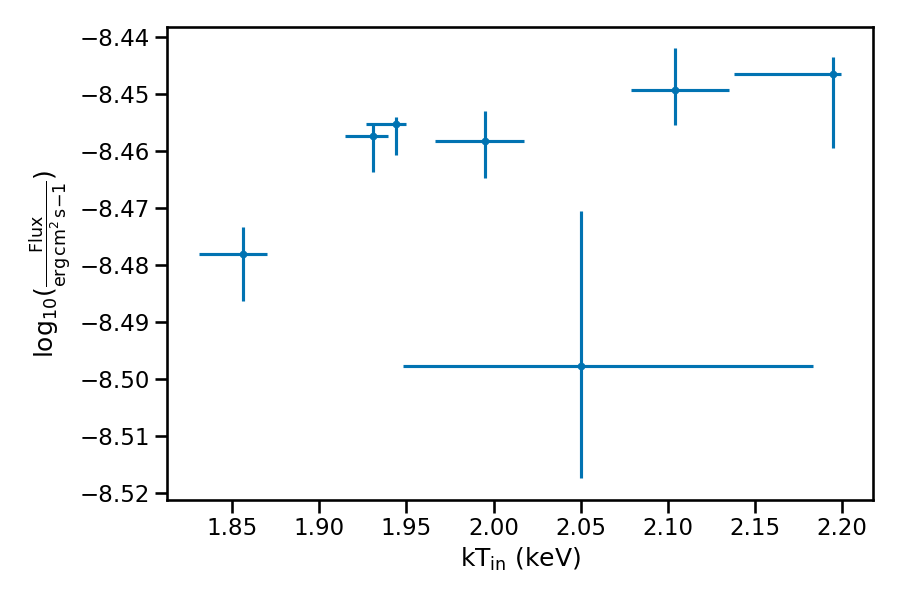

In [3]:
plt.figure(figsize=(9,6))
plt.errorbar(diskbb_Tin[0], diskbb_flux[0], xerr=[diskbb_Tin[1], diskbb_Tin[2]], yerr = [diskbb_flux[1],diskbb_flux[2]], fmt = '.')
# plt.xscale('log')
plt.ylabel(r'$\mathrm{log_{10}(\frac{Flux}{erg\,cm^2\,s{-1}})}$')
plt.xlabel(r'$\mathrm{kT_{in}\ (keV)}$')
plt.tight_layout()
plt.show()

<IPython.core.display.Javascript object>


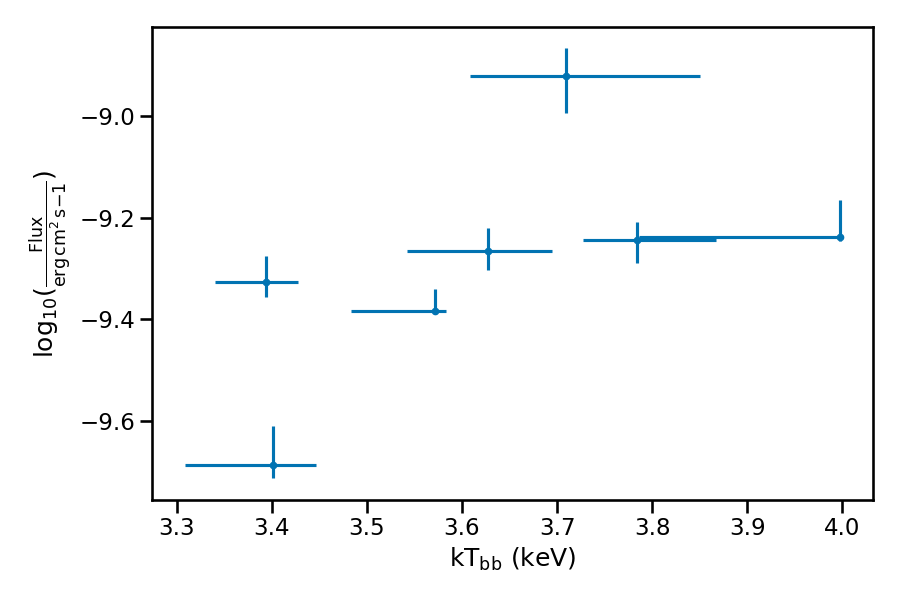

In [4]:
plt.figure(figsize=(9,6))
plt.errorbar(relxillNS_T[0], relxillNS_flux[0], xerr=[relxillNS_T[1], relxillNS_T[2]], yerr = [relxillNS_flux[1],relxillNS_flux[2]], fmt = '.')
# plt.xscale('log')
plt.ylabel(r'$\mathrm{log_{10}(\frac{Flux}{erg\,cm^2\,s{-1}})}$')
plt.xlabel(r'$\mathrm{kT_{bb}\ (keV)}$')
plt.tight_layout()
plt.show()

<IPython.core.display.Javascript object>


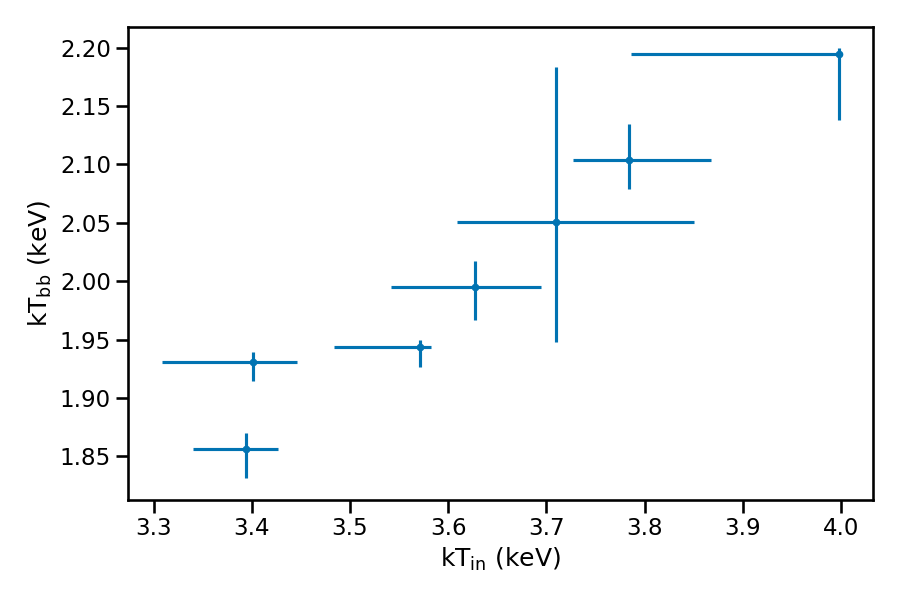

In [5]:
plt.figure(figsize=(9,6))
plt.errorbar(relxillNS_T[0], diskbb_Tin[0], xerr=[relxillNS_T[1], relxillNS_T[2]], yerr = [diskbb_Tin[1],diskbb_Tin[2]], fmt = '.')
# plt.xscale('log')
plt.ylabel(r'$\mathrm{kT_{bb}\ (keV)}$')
plt.xlabel(r'$\mathrm{kT_{in}\ (keV)}$')
plt.tight_layout()
plt.show()

<IPython.core.display.Javascript object>


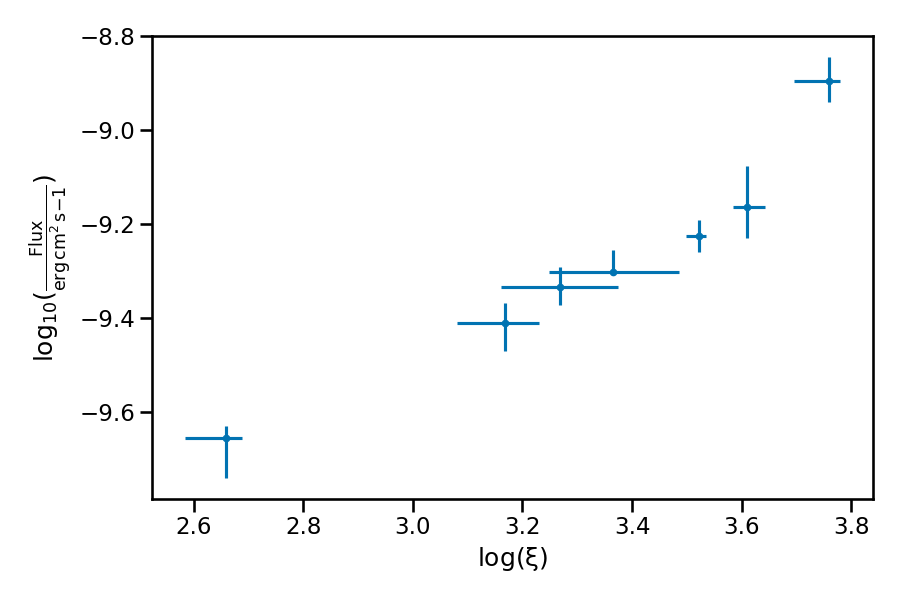

In [28]:
plt.figure(figsize=(9,6))
plt.errorbar(relxillNS_logxi[0], relxillNS_flux[0], xerr=[relxillNS_logxi[1], relxillNS_logxi[2]], yerr = [relxillNS_flux[1],relxillNS_flux[2]], fmt = '.')
# plt.xscale('log')
plt.ylabel(r'$\mathrm{log_{10}(\frac{Flux}{erg\,cm^2\,s{-1}})}$')
plt.xlabel(r'$\mathrm{log(\xi)}$')
plt.tight_layout()
plt.show()

<IPython.core.display.Javascript object>


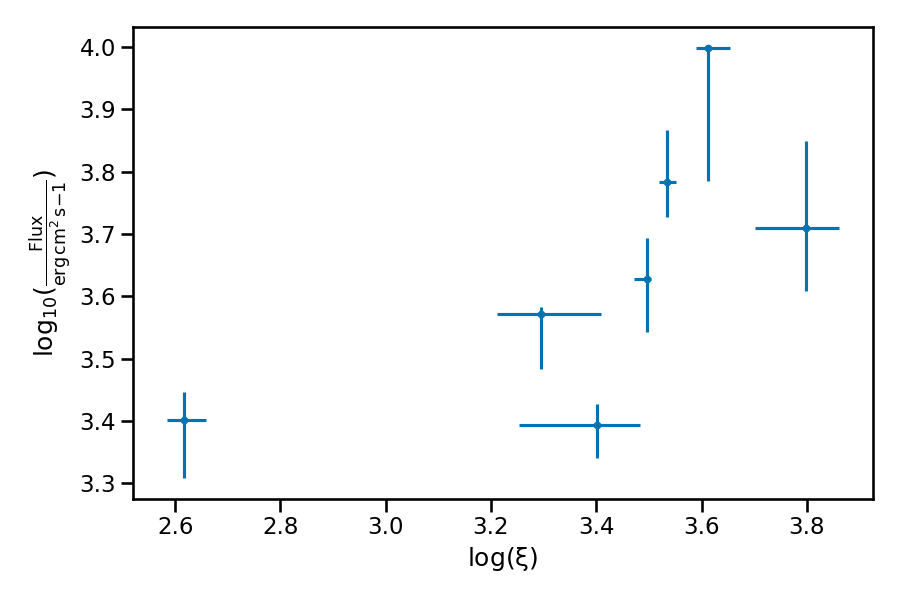

In [6]:
plt.figure(figsize=(9,6))
plt.errorbar(relxillNS_logxi[0], relxillNS_T[0], xerr=[relxillNS_logxi[1], relxillNS_logxi[2]], yerr = [relxillNS_T[1],relxillNS_T[2]], fmt = '.')
# plt.xscale('log')
plt.ylabel(r'$\mathrm{log_{10}(\frac{Flux}{erg\,cm^2\,s{-1}})}$')
plt.xlabel(r'$\mathrm{log(\xi)}$')
plt.tight_layout()
plt.show()

# Spectral parameters

In [7]:
# Data format: [[Measurement], [- error], [+ error]]
diskbb_flux = np.array([[-8.46054, -8.47852, -8.45337, -8.45438, -8.45362, -8.46078, -8.50859],\
               [0.00192444, 0.00578781, 0.00515421, 0.00660957, 0.006437, 0.016282, 0.0215966],\
               [0.00703119, 0.00503803, 0.00681532, 0.00127195, 0.0061235, 0.0142321, 0.0182063]])

diskbb_Tin = np.array([[1.91593, 1.85318, 1.94780, 2.01278, 2.08365, 2.12809, 1.99874],\
               [0.00626262, 0.0238185, 0.0194787, 0.0324177, 0.0288373, 0.0923705, 0.108439],\
               [0.0192637, 0.0193707, 0.0294239, 0.0048061, 0.0252854, 0.0512553, 0.0793257]])

relxillNS_flux = np.array([[-9.65409, -9.33357, -9.41113, -9.30152, -9.22550, -9.16442, -8.89532],\
                 [0.0855563, 0.0383582, 0.0579525, 0.0059484, 0.0338559, 0.0644419, 0.0442195],\
                 [0.0250104, 0.0430858, 0.0444424, 0.0464611, 0.0343867, 0.0870764, 0.0514712]])

relxillNS_T = np.array([[3.35584, 3.31971, 3.49738, 3.59964, 3.69685, 3.82350, 3.64039],\
              [0.0864216, 0.0675248, 0.0447243, 0.100244, 0.0806346, 0.148214, 0.0921216],\
              [0.100586, 0.0322959, 0.0663408, 0.0427998, 0.0516848, 0.09666, 0.0656766]])

relxillNS_logxi = np.array([[2.65968, 3.26918, 3.16777, 3.36455, 3.52174, 3.61028, 3.75869],\
                  [0.0751432, 0.109226, 0.087048, 0.116311, 0.0234899, 0.0263532, 0.0624417],\
                  [0.0291406, 0.104508, 0.0623015, 0.120902, 0.0131018, 0.0318508, 0.0212744]])

<IPython.core.display.Javascript object>


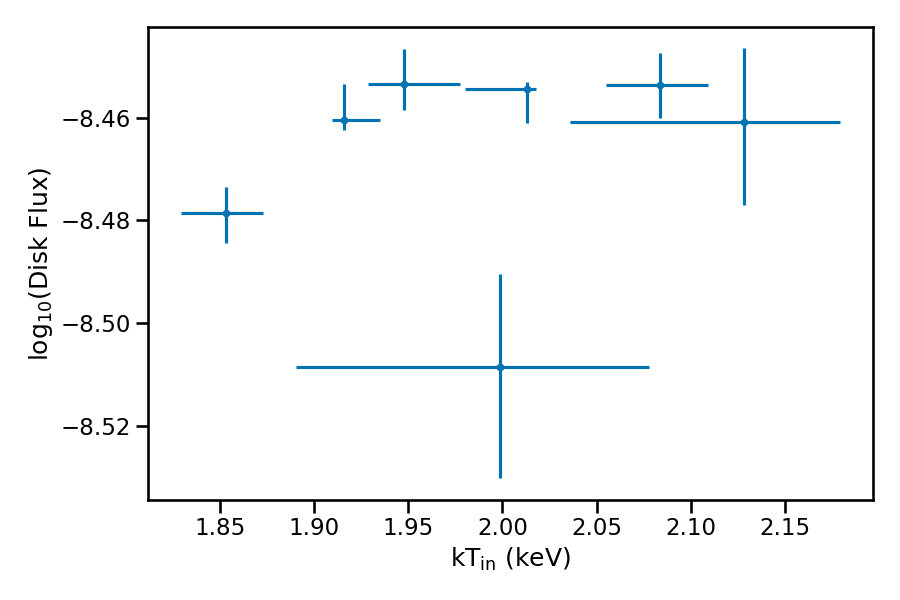

In [19]:
plt.figure(figsize=(9,6))
plt.errorbar(diskbb_Tin[0], diskbb_flux[0], xerr=[diskbb_Tin[1], diskbb_Tin[2]], yerr = [diskbb_flux[1],diskbb_flux[2]], fmt = '.')
# plt.xscale('log')
plt.ylabel(r'$\mathrm{log_{10}(Disk\ Flux)}$')
plt.xlabel(r'$\mathrm{kT_{in}\ (keV)}$')
plt.tight_layout()
plt.savefig(plot_dir + 'flux_Tin.pdf')

<IPython.core.display.Javascript object>


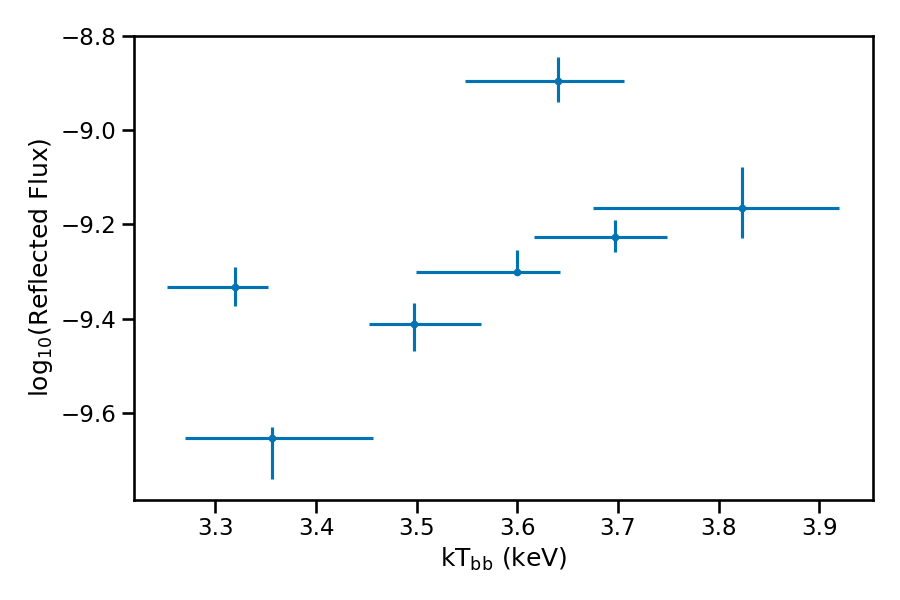

In [20]:
plt.figure(figsize=(9,6))
plt.errorbar(relxillNS_T[0], relxillNS_flux[0], xerr=[relxillNS_T[1], relxillNS_T[2]], yerr = [relxillNS_flux[1],relxillNS_flux[2]], fmt = '.')
# plt.xscale('log')
plt.ylabel(r'$\mathrm{log_{10}(Reflected\ Flux)}$')
plt.xlabel(r'$\mathrm{kT_{bb}\ (keV)}$')
plt.tight_layout()
plt.savefig(plot_dir + 'flux_Tbb.pdf')


<IPython.core.display.Javascript object>


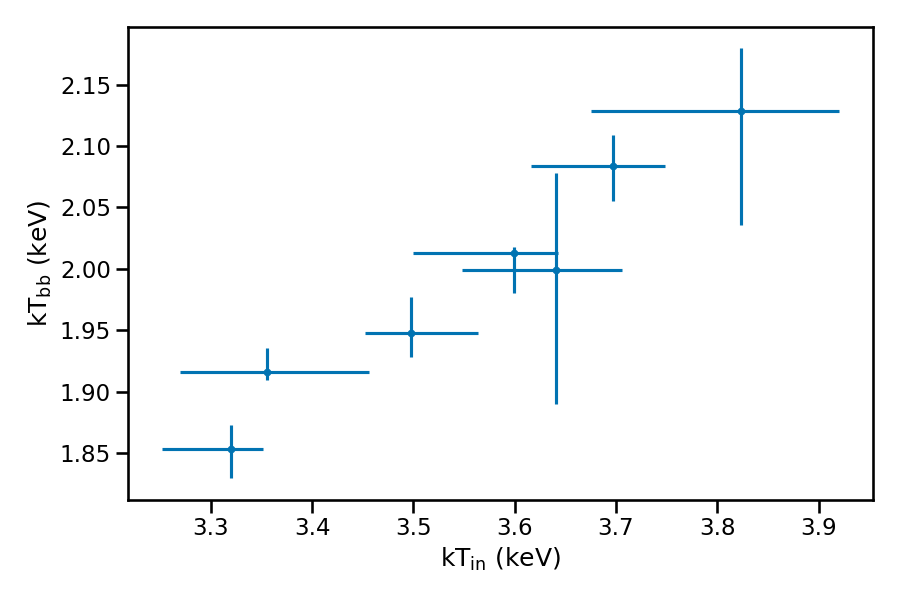

In [21]:
plt.figure(figsize=(9,6))
plt.errorbar(relxillNS_T[0], diskbb_Tin[0], xerr=[relxillNS_T[1], relxillNS_T[2]], yerr = [diskbb_Tin[1],diskbb_Tin[2]], fmt = '.')
# plt.xscale('log')
plt.ylabel(r'$\mathrm{kT_{bb}\ (keV)}$')
plt.xlabel(r'$\mathrm{kT_{in}\ (keV)}$')
plt.tight_layout()
plt.savefig(plot_dir + 'Tbb_Tin.pdf')


<IPython.core.display.Javascript object>


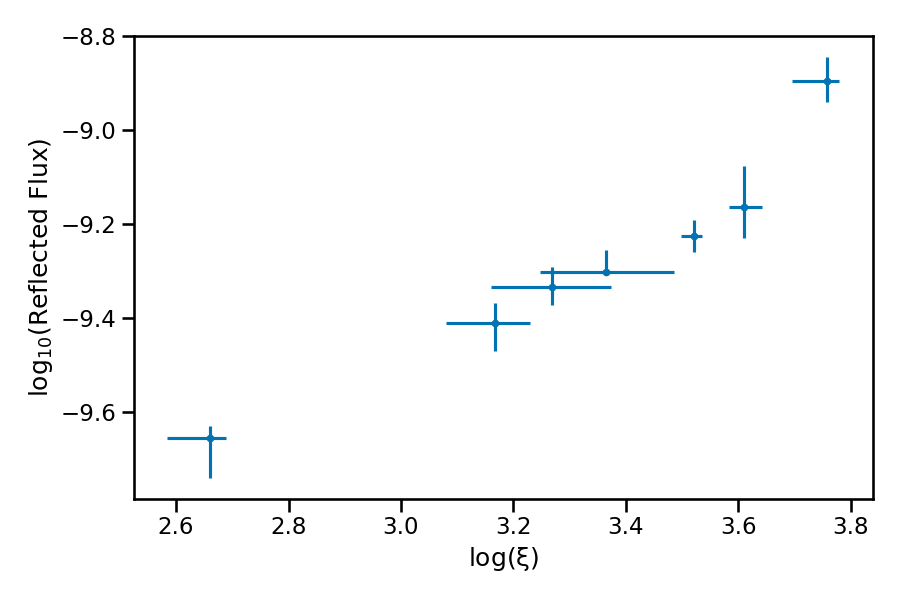

In [22]:
plt.figure(figsize=(9,6))
plt.errorbar(relxillNS_logxi[0], relxillNS_flux[0], xerr=[relxillNS_logxi[1], relxillNS_logxi[2]], yerr = [relxillNS_flux[1],relxillNS_flux[2]], fmt = '.')
# plt.xscale('log')
plt.ylabel(r'$\mathrm{log_{10}(Reflected\ Flux)}$')
plt.xlabel(r'$\mathrm{log(\xi)}$')
plt.tight_layout()
plt.savefig(plot_dir + 'flux_chi.pdf')


<IPython.core.display.Javascript object>


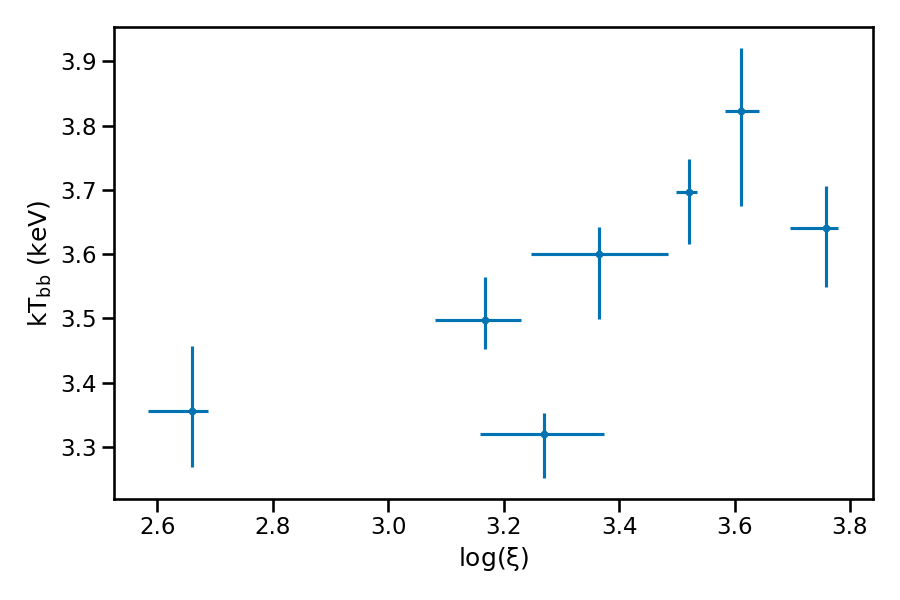

In [23]:
plt.figure(figsize=(9,6))
plt.errorbar(relxillNS_logxi[0], relxillNS_T[0], xerr=[relxillNS_logxi[1], relxillNS_logxi[2]], yerr = [relxillNS_T[1],relxillNS_T[2]], fmt = '.')
# plt.xscale('log')
plt.ylabel(r'$\mathrm{kT_{bb}\ (keV)}$')
plt.xlabel(r'$\mathrm{log(\xi)}$')
plt.tight_layout()
plt.savefig(plot_dir + 'Tbb_chi.pdf')


<IPython.core.display.Javascript object>


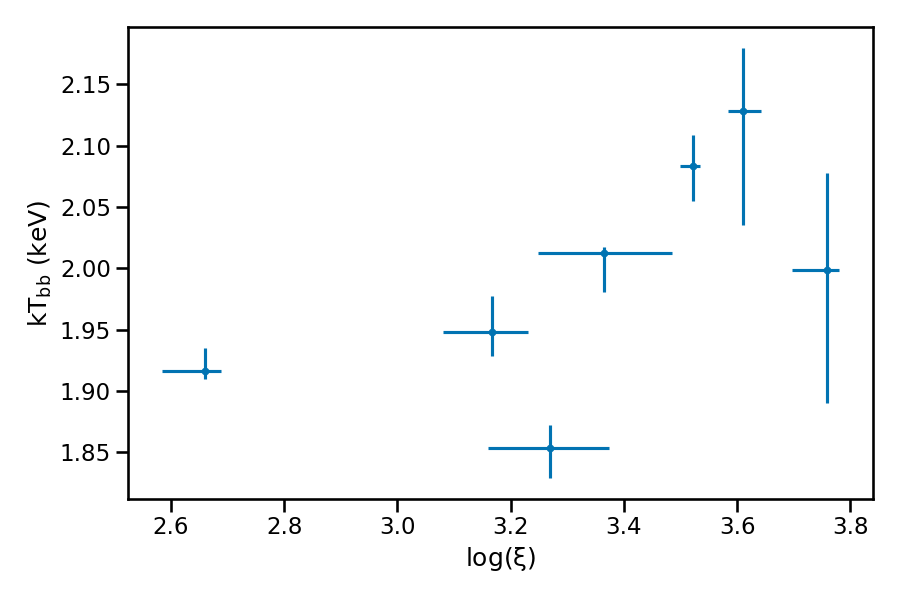

In [27]:
plt.figure(figsize=(9,6))
plt.errorbar(relxillNS_logxi[0], diskbb_Tin[0], xerr=[relxillNS_logxi[1], relxillNS_logxi[2]], yerr = [diskbb_Tin[1],diskbb_Tin[2]], fmt = '.')
# plt.yscale('log')
plt.ylabel(r'$\mathrm{kT_{bb}\ (keV)}$')
plt.xlabel(r'$\mathrm{log(\xi)}$')
plt.tight_layout()
plt.savefig(plot_dir + 'Tin_chi.pdf')


In [33]:
from scipy import odr
linear = odr.Model(line)
mydata = odr.RealData(diskbb_Tin[0], relxillNS_T[0], sx=(diskbb_Tin[1] + diskbb_Tin[2])/2, sy=(relxillNS_T[1] + relxillNS_T[2])/2)
myodr = odr.ODR(mydata, linear, beta0=[1.8, 0.0])
myoutput = myodr.run()
myoutput.pprint()



Beta: [1.77379424 0.02288176]
Beta Std Error: [0.15566453 0.30558071]
Beta Covariance: [[ 0.14815362 -0.29056354]
 [-0.29056354  0.57093257]]
Residual Variance: 0.16355621061656195
Inverse Condition #: 0.002103081495643143
Reason(s) for Halting:
  Sum of squares convergence


In [34]:
from scipy import odr
linear = odr.Model(line)
mydata = odr.RealData(np.log10(diskbb_Tin[0]), diskbb_flux[0], sx=((diskbb_Tin[1] + diskbb_Tin[2])/2)/(diskbb_Tin[0]*np.log(10)), sy=(diskbb_flux[1] + diskbb_flux[2])/2)
myodr = odr.ODR(mydata, linear, beta0=[1.8, 0.0])
myoutput = myodr.run()
myoutput.pprint()



Beta: [ 0.47197926 -8.59861782]
Beta Std Error: [0.21611269 0.06334304]
Beta Covariance: [[ 0.02090933 -0.00611893]
 [-0.00611893  0.00179629]]
Residual Variance: 2.2336776168272388
Inverse Condition #: 0.014466480093413113
Reason(s) for Halting:
  Sum of squares convergence


In [36]:
from scipy import odr
linear = odr.Model(line)
mydata = odr.RealData(np.log10(relxillNS_T[0]), relxillNS_flux[0], sx=((relxillNS_T[1] + relxillNS_T[2])/2)/(relxillNS_T[0]*np.log(10)), sy=(relxillNS_flux[1] + relxillNS_flux[2])/2)
myodr = odr.ODR(mydata, linear, beta0=[1.8, 0.0])
myoutput = myodr.run()
myoutput.pprint()



Beta: [ 13.049741  -16.4324933]
Beta Std Error: [6.75639654 3.69837248]
Beta Covariance: [[10.81537358 -5.9183319 ]
 [-5.9183319   3.24065322]]
Residual Variance: 4.220741325825832
Inverse Condition #: 0.003904791896292271
Reason(s) for Halting:
  Sum of squares convergence


In [37]:
from scipy import odr
linear = odr.Model(line)
mydata = odr.RealData(np.log10(relxillNS_logxi[0]), relxillNS_flux[0], sx=(relxillNS_logxi[1] + relxillNS_logxi[2])/2, sy=(relxillNS_flux[1] + relxillNS_flux[2])/2)
myodr = odr.ODR(mydata, linear, beta0=[1.8, 0.0])
myoutput = myodr.run()
myoutput.pprint()



Beta: [  5.06689218 -11.95641405]
Beta Std Error: [0.97383827 0.5278821 ]
Beta Covariance: [[ 4.8945571  -2.64821677]
 [-2.64821677  1.43818118]]
Residual Variance: 0.19375828373897816
Inverse Condition #: 0.009595549450550918
Reason(s) for Halting:
  Sum of squares convergence
